<a href="https://colab.research.google.com/github/ZuzannaPietka/seminarium_magisterkie/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision.utils import save_image
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!ls "drive/My Drive/obrazy/Pablo Picasso"

Mounted at /content/drive
Pablo_Picasso_100.jpg  Pablo_Picasso_233.jpg  Pablo_Picasso_366.jpg
Pablo_Picasso_101.jpg  Pablo_Picasso_234.jpg  Pablo_Picasso_367.jpg
Pablo_Picasso_102.jpg  Pablo_Picasso_235.jpg  Pablo_Picasso_368.jpg
Pablo_Picasso_103.jpg  Pablo_Picasso_236.jpg  Pablo_Picasso_369.jpg
Pablo_Picasso_104.jpg  Pablo_Picasso_237.jpg  Pablo_Picasso_36.jpg
Pablo_Picasso_105.jpg  Pablo_Picasso_238.jpg  Pablo_Picasso_370.jpg
Pablo_Picasso_106.jpg  Pablo_Picasso_239.jpg  Pablo_Picasso_371.jpg
Pablo_Picasso_107.jpg  Pablo_Picasso_23.jpg   Pablo_Picasso_372.jpg
Pablo_Picasso_108.jpg  Pablo_Picasso_240.jpg  Pablo_Picasso_373.jpg
Pablo_Picasso_109.jpg  Pablo_Picasso_241.jpg  Pablo_Picasso_374.jpg
Pablo_Picasso_10.jpg   Pablo_Picasso_242.jpg  Pablo_Picasso_375.jpg
Pablo_Picasso_110.jpg  Pablo_Picasso_243.jpg  Pablo_Picasso_376.jpg
Pablo_Picasso_111.jpg  Pablo_Picasso_244.jpg  Pablo_Picasso_377.jpg
Pablo_Picasso_112.jpg  Pablo_Picasso_245.jpg  Pablo_Picasso_378.jpg
Pablo_Picasso_113.jpg  

There are 439 pictures.


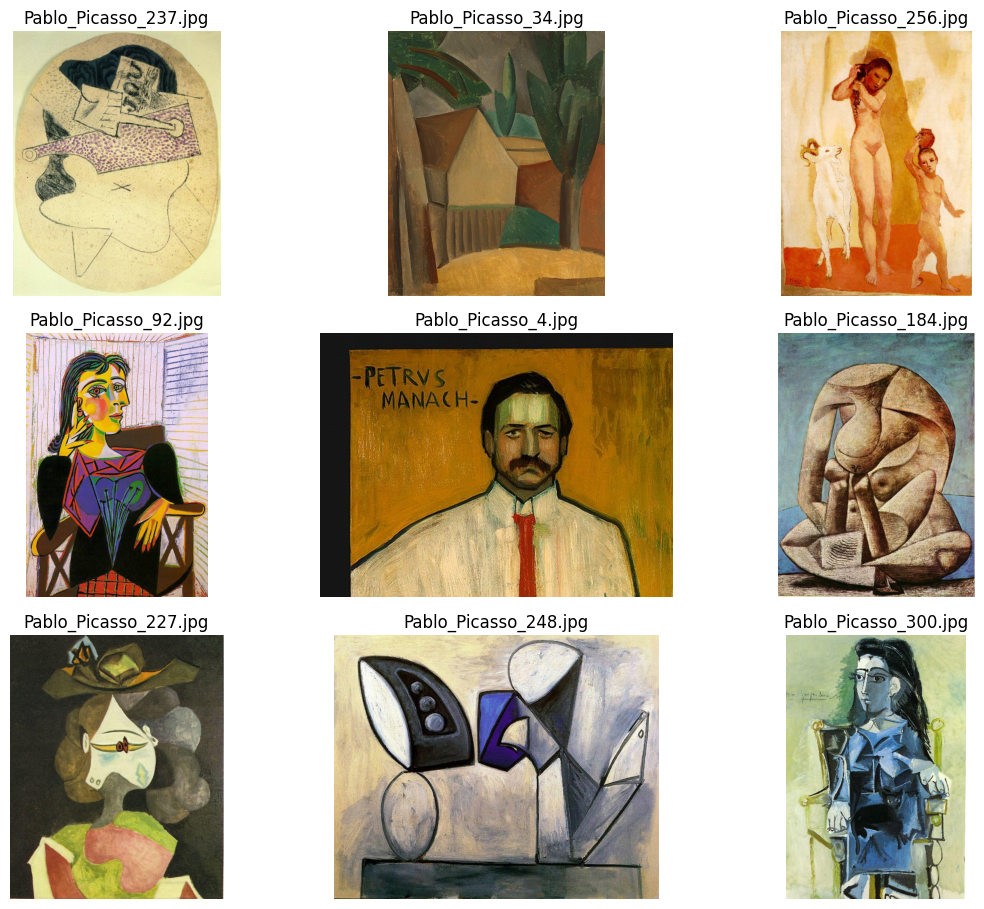

In [ ]:
PATH = "drive/My Drive/obrazy/Pablo Picasso/"
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [ ]:
batch_size = 32
batchSize = 64
imageSize = 64

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder("drive/My Drive/obrazy/", transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

In [ ]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder("drive/My Drive/obrazy/", transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

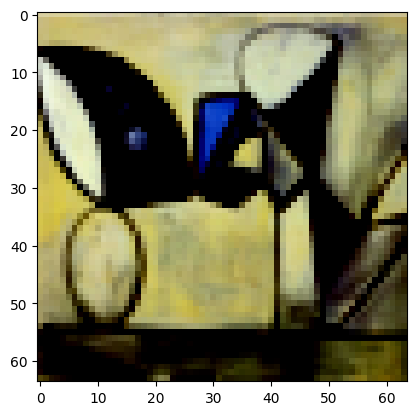

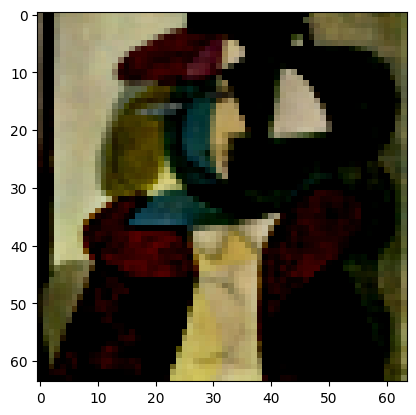

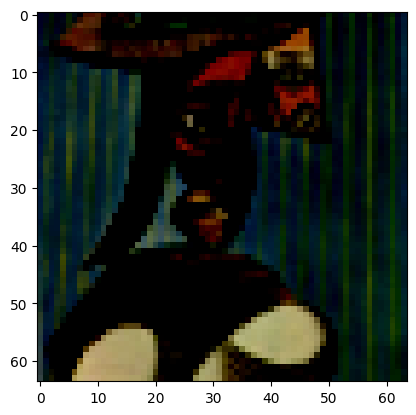

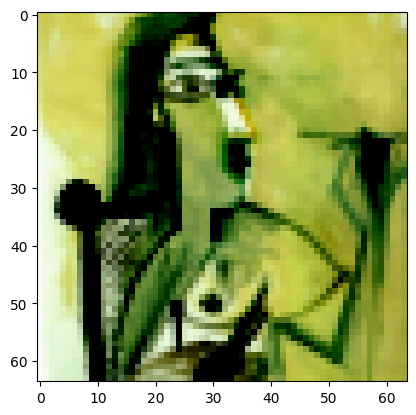

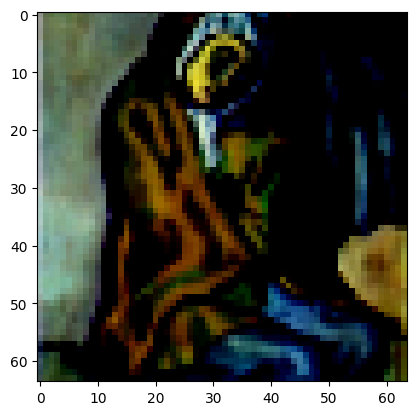

In [ ]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

In [ ]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [ ]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [ ]:
!mkdir results
!ls

drive  results	sample_data


In [ ]:
EPOCH = 100
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [ ]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

[0/100][0/14] Loss_D: 1.8670; Loss_G: 21.3091
[0/100][1/14] Loss_D: 9.8316; Loss_G: 27.0268
[0/100][2/14] Loss_D: 2.3211; Loss_G: 7.5257
[0/100][3/14] Loss_D: 100.2878; Loss_G: 0.0000
[0/100][4/14] Loss_D: 100.0047; Loss_G: 0.0000
[0/100][5/14] Loss_D: 100.0103; Loss_G: 0.0000
[0/100][6/14] Loss_D: 100.0461; Loss_G: 0.0000
[0/100][7/14] Loss_D: 100.0062; Loss_G: 0.0000
[0/100][8/14] Loss_D: 100.0001; Loss_G: 0.0000
[0/100][9/14] Loss_D: 100.0002; Loss_G: 0.0000
[0/100][10/14] Loss_D: 100.0000; Loss_G: 0.0000
[0/100][11/14] Loss_D: 100.0001; Loss_G: 0.0000
[0/100][12/14] Loss_D: 100.0001; Loss_G: 0.0000
[0/100][13/14] Loss_D: 100.0001; Loss_G: 0.0000
[1/100][0/14] Loss_D: 100.0000; Loss_G: 0.0000
[1/100][1/14] Loss_D: 100.0000; Loss_G: 0.0000
[1/100][2/14] Loss_D: 100.0000; Loss_G: 0.0000
[1/100][3/14] Loss_D: 100.0000; Loss_G: 0.0000
[1/100][4/14] Loss_D: 100.0001; Loss_G: 0.0000
[1/100][5/14] Loss_D: 100.0000; Loss_G: 0.0000
[1/100][6/14] Loss_D: 100.0002; Loss_G: 0.0000
[1/100][7/14]

In [ ]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [ ]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [ ]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

<ipython-input-18-a6affce909ef>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/14 [00:00<?, ?it/s]

[1/100][7/14] Loss_D: 0.4373 Loss_G: 5.9213 D(x): 0.8811 D(G(z)): 0.0926 / 0.0014
[1/100][14/14] Loss_D: 0.7097 Loss_G: 7.2263 D(x): 0.5979 D(G(z)): 0.0003 / 0.0003


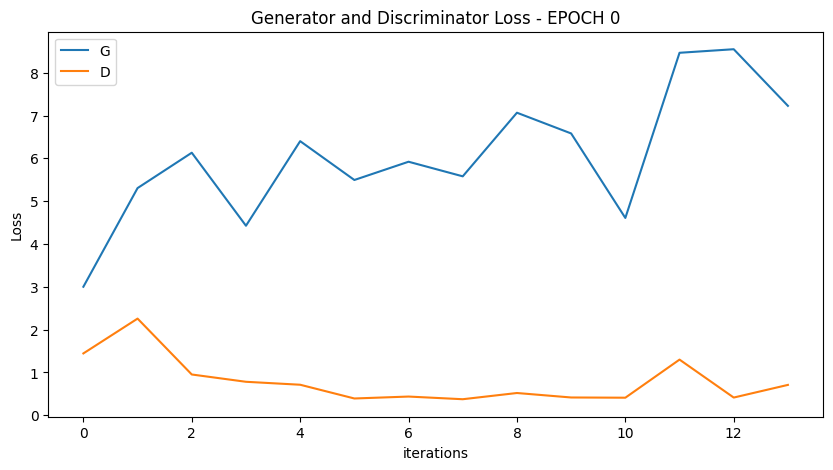

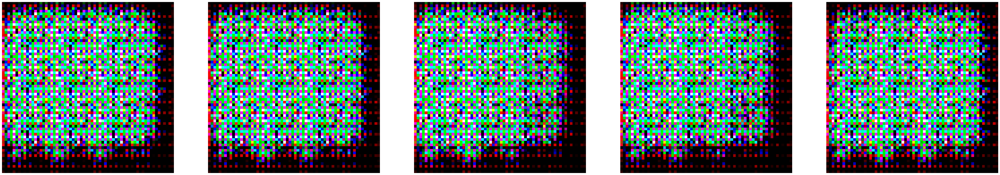

  0%|          | 0/14 [00:00<?, ?it/s]

[2/100][7/14] Loss_D: 0.5300 Loss_G: 3.2329 D(x): 0.7527 D(G(z)): 0.0985 / 0.0302
[2/100][14/14] Loss_D: 1.1463 Loss_G: 3.7416 D(x): 0.4115 D(G(z)): 0.0354 / 0.0288


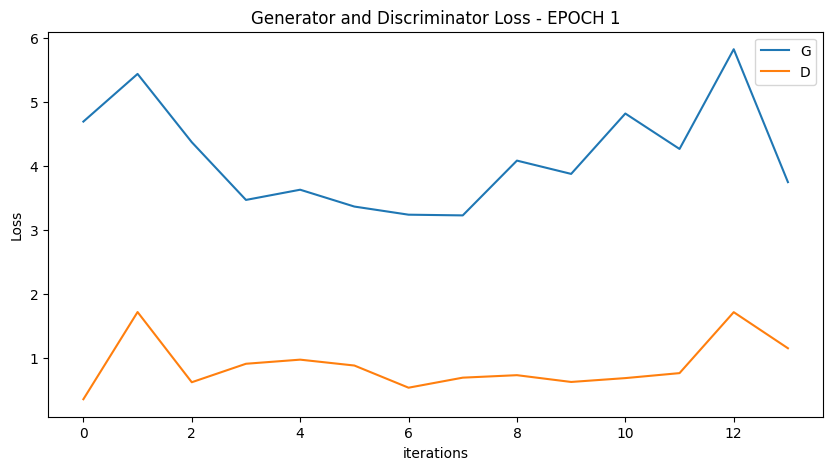

  0%|          | 0/14 [00:00<?, ?it/s]

[3/100][7/14] Loss_D: 1.1693 Loss_G: 1.8135 D(x): 0.4202 D(G(z)): 0.1996 / 0.1624
[3/100][14/14] Loss_D: 1.1365 Loss_G: 2.2124 D(x): 0.7946 D(G(z)): 0.5049 / 0.0931


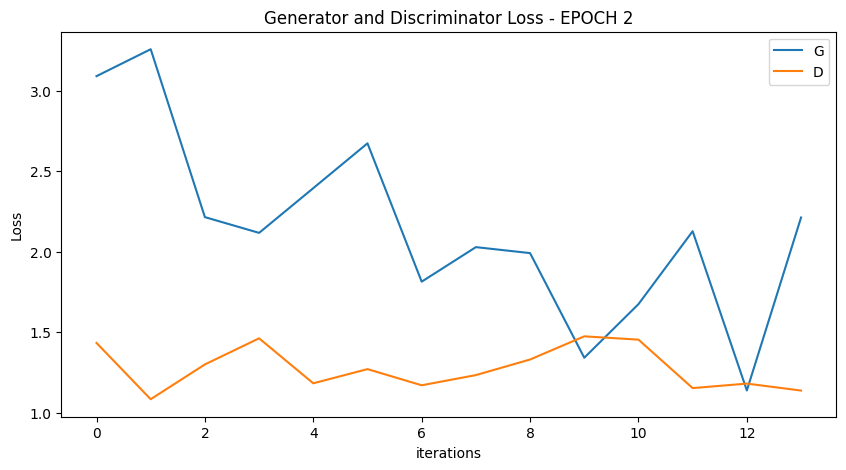

  0%|          | 0/14 [00:00<?, ?it/s]

[4/100][7/14] Loss_D: 1.0881 Loss_G: 1.9812 D(x): 0.6375 D(G(z)): 0.3758 / 0.1446
[4/100][14/14] Loss_D: 1.6064 Loss_G: 1.4657 D(x): 0.2717 D(G(z)): 0.2003 / 0.2339


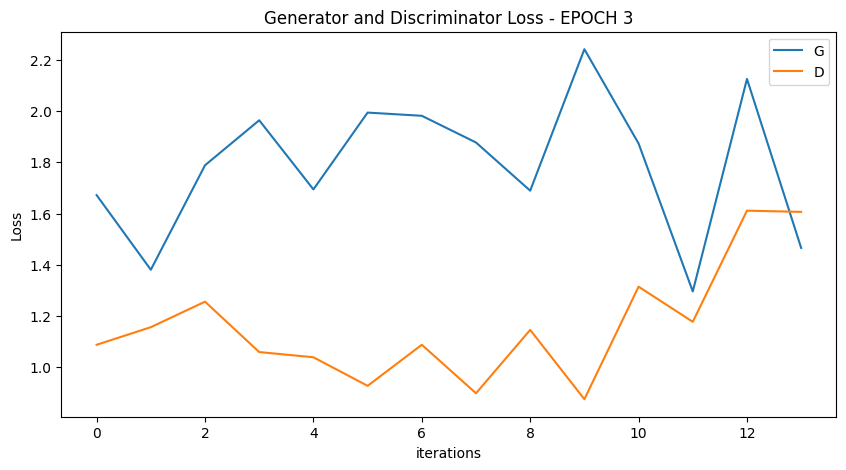

  0%|          | 0/14 [00:00<?, ?it/s]

[5/100][7/14] Loss_D: 1.4488 Loss_G: 1.5980 D(x): 0.4157 D(G(z)): 0.3872 / 0.1836
[5/100][14/14] Loss_D: 1.3192 Loss_G: 1.8734 D(x): 0.6170 D(G(z)): 0.4566 / 0.1468


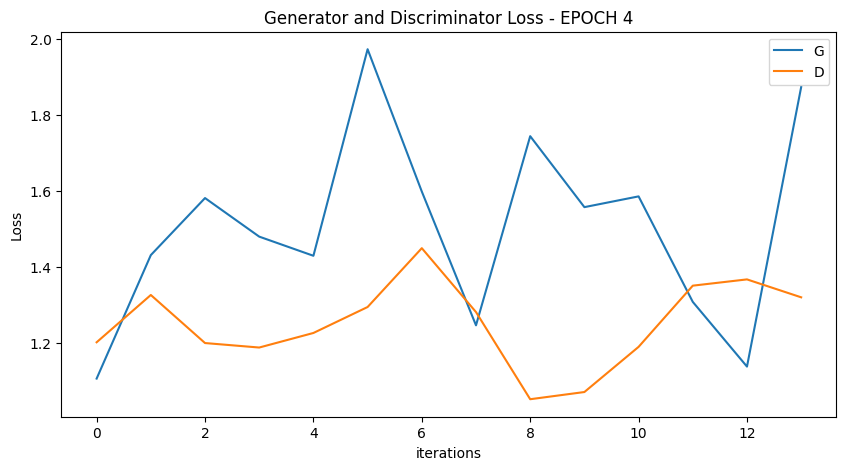

  0%|          | 0/14 [00:00<?, ?it/s]

[6/100][7/14] Loss_D: 1.3502 Loss_G: 1.2304 D(x): 0.3667 D(G(z)): 0.2562 / 0.2767
[6/100][14/14] Loss_D: 1.0002 Loss_G: 1.9269 D(x): 0.6543 D(G(z)): 0.3806 / 0.1324


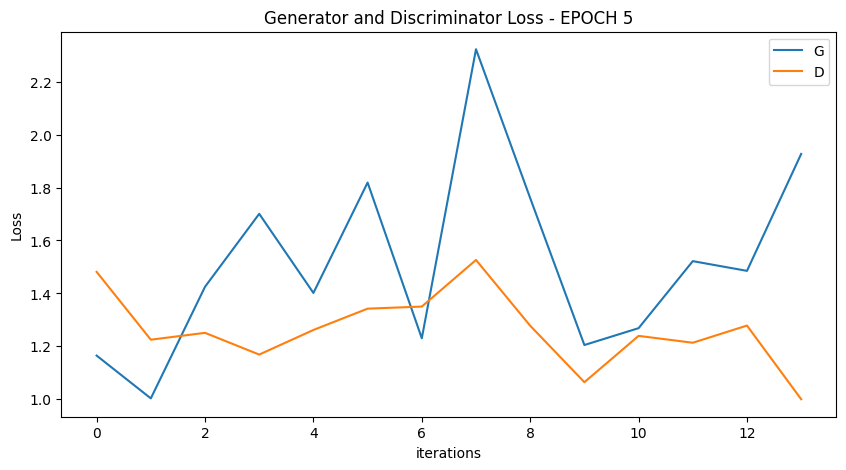

  0%|          | 0/14 [00:00<?, ?it/s]

[7/100][7/14] Loss_D: 1.4285 Loss_G: 2.1011 D(x): 0.5970 D(G(z)): 0.5310 / 0.1037
[7/100][14/14] Loss_D: 1.0962 Loss_G: 1.3051 D(x): 0.5232 D(G(z)): 0.3121 / 0.2598


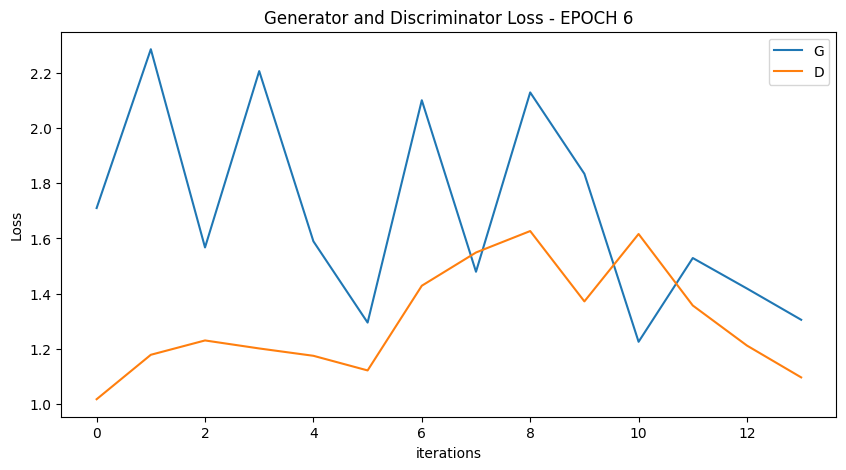

  0%|          | 0/14 [00:00<?, ?it/s]

[8/100][7/14] Loss_D: 1.0159 Loss_G: 1.3979 D(x): 0.5030 D(G(z)): 0.2357 / 0.2231
[8/100][14/14] Loss_D: 1.2082 Loss_G: 1.3267 D(x): 0.5543 D(G(z)): 0.4068 / 0.2614


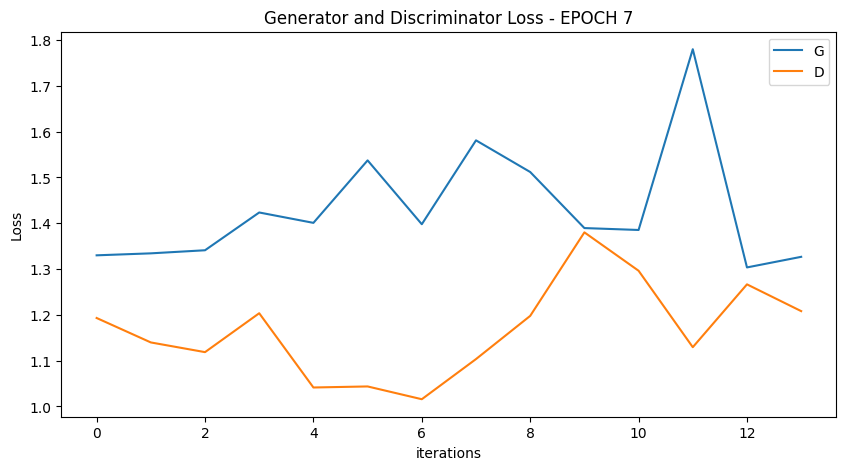

  0%|          | 0/14 [00:00<?, ?it/s]

[9/100][7/14] Loss_D: 1.2280 Loss_G: 1.5337 D(x): 0.5250 D(G(z)): 0.3904 / 0.2028
[9/100][14/14] Loss_D: 1.3891 Loss_G: 1.8526 D(x): 0.5134 D(G(z)): 0.4703 / 0.1403


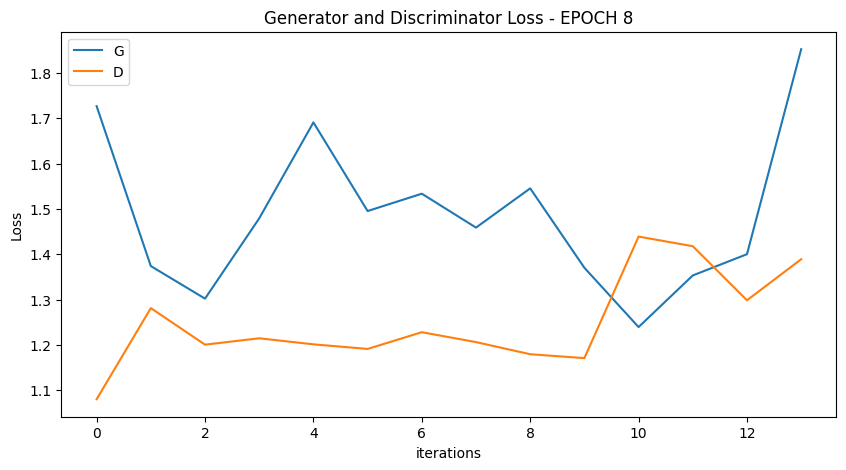

  0%|          | 0/14 [00:00<?, ?it/s]

[10/100][7/14] Loss_D: 1.1027 Loss_G: 1.5988 D(x): 0.5380 D(G(z)): 0.3210 / 0.2025
[10/100][14/14] Loss_D: 0.8271 Loss_G: 2.9945 D(x): 0.7744 D(G(z)): 0.3339 / 0.0411


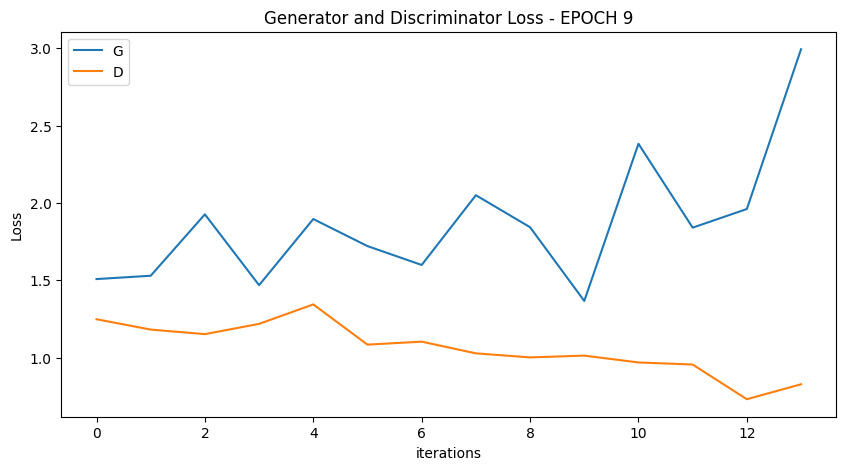

  0%|          | 0/14 [00:00<?, ?it/s]

[11/100][7/14] Loss_D: 1.4808 Loss_G: 1.3570 D(x): 0.4715 D(G(z)): 0.4860 / 0.2389
[11/100][14/14] Loss_D: 1.3583 Loss_G: 1.6356 D(x): 0.3996 D(G(z)): 0.3011 / 0.1955


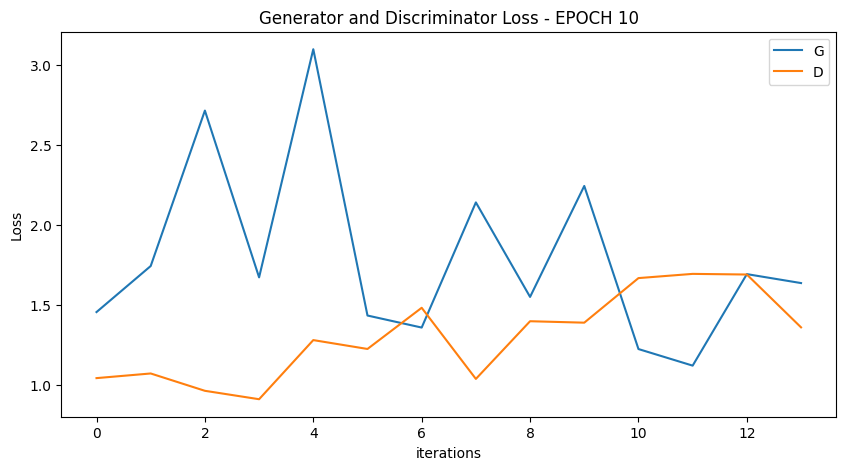

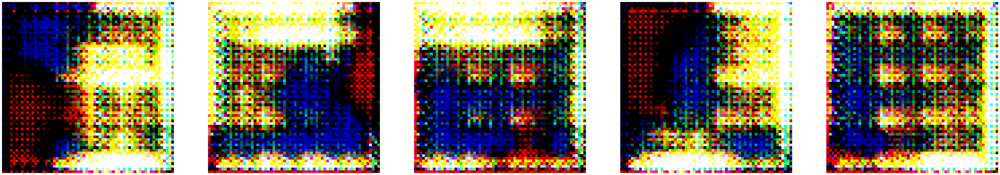

  0%|          | 0/14 [00:00<?, ?it/s]

[12/100][7/14] Loss_D: 1.1510 Loss_G: 1.9537 D(x): 0.6027 D(G(z)): 0.4075 / 0.1247
[12/100][14/14] Loss_D: 0.9564 Loss_G: 1.6203 D(x): 0.6896 D(G(z)): 0.3630 / 0.1874


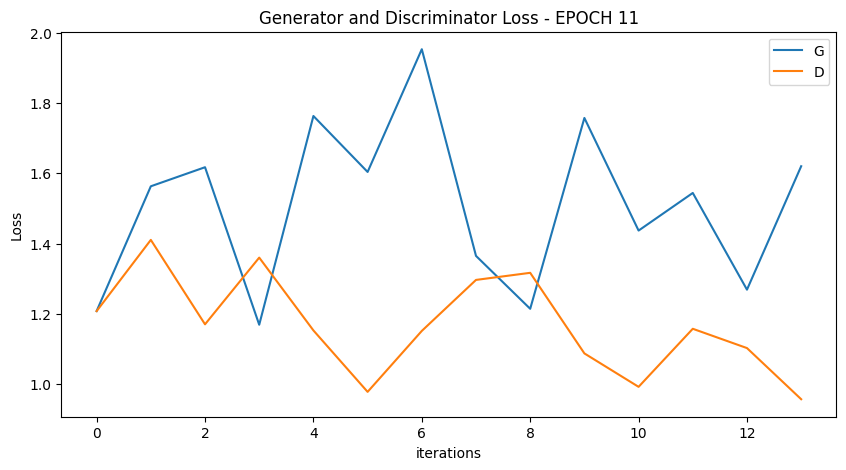

  0%|          | 0/14 [00:00<?, ?it/s]

[13/100][7/14] Loss_D: 1.2975 Loss_G: 1.5069 D(x): 0.6828 D(G(z)): 0.5042 / 0.2141
[13/100][14/14] Loss_D: 1.1469 Loss_G: 1.9205 D(x): 0.5424 D(G(z)): 0.3341 / 0.1437


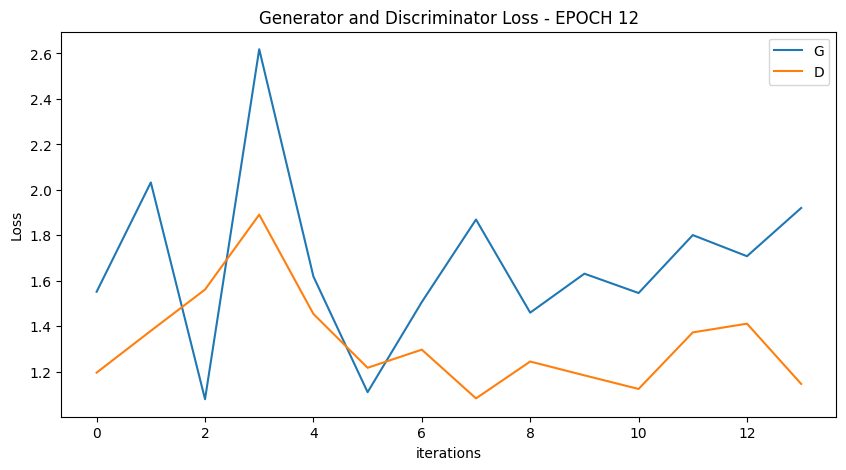

  0%|          | 0/14 [00:00<?, ?it/s]

[14/100][7/14] Loss_D: 1.0554 Loss_G: 1.6046 D(x): 0.5919 D(G(z)): 0.3709 / 0.1878
[14/100][14/14] Loss_D: 1.0796 Loss_G: 1.6813 D(x): 0.6244 D(G(z)): 0.3896 / 0.1682


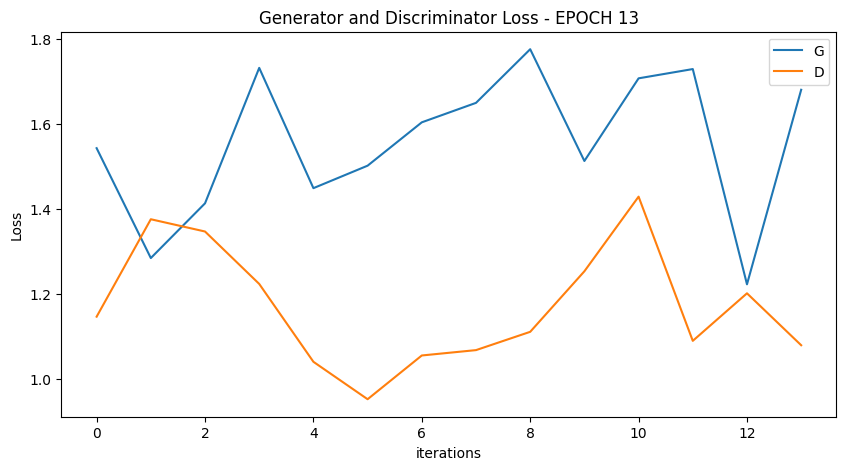

  0%|          | 0/14 [00:00<?, ?it/s]

[15/100][7/14] Loss_D: 1.2070 Loss_G: 1.7184 D(x): 0.5503 D(G(z)): 0.4025 / 0.1684
[15/100][14/14] Loss_D: 0.9534 Loss_G: 2.0464 D(x): 0.6124 D(G(z)): 0.3046 / 0.1210


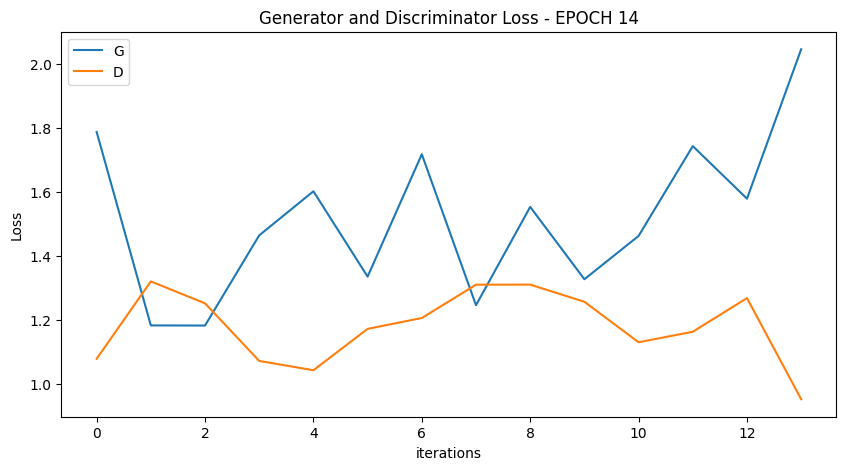

  0%|          | 0/14 [00:00<?, ?it/s]

[16/100][7/14] Loss_D: 1.0222 Loss_G: 1.2675 D(x): 0.5461 D(G(z)): 0.2965 / 0.2733
[16/100][14/14] Loss_D: 1.3286 Loss_G: 1.2179 D(x): 0.3237 D(G(z)): 0.1063 / 0.3043


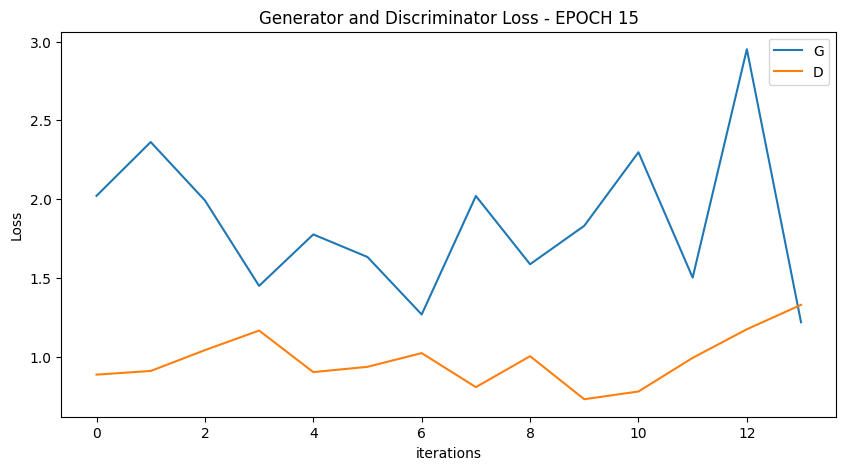

  0%|          | 0/14 [00:00<?, ?it/s]

[17/100][7/14] Loss_D: 1.1411 Loss_G: 2.8010 D(x): 0.7877 D(G(z)): 0.4910 / 0.0598
[17/100][14/14] Loss_D: 1.0473 Loss_G: 1.7992 D(x): 0.5243 D(G(z)): 0.2704 / 0.1469


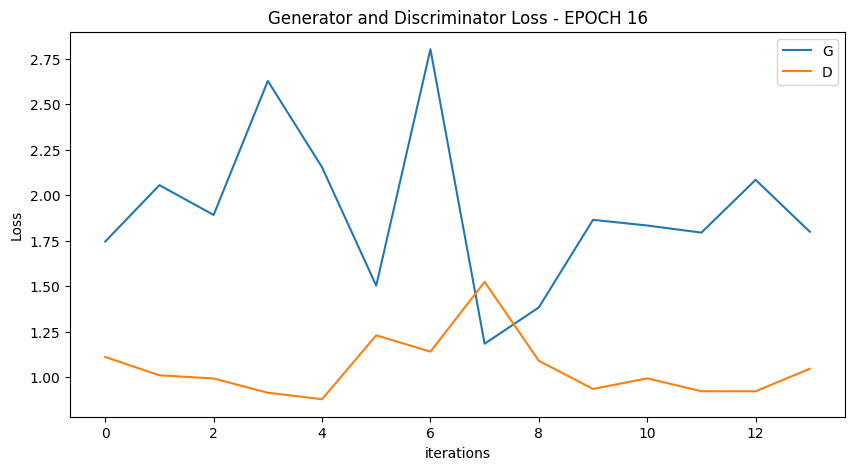

  0%|          | 0/14 [00:00<?, ?it/s]

[18/100][7/14] Loss_D: 1.2734 Loss_G: 1.4622 D(x): 0.2986 D(G(z)): 0.0922 / 0.2175
[18/100][14/14] Loss_D: 1.2938 Loss_G: 1.7435 D(x): 0.3574 D(G(z)): 0.2252 / 0.1713


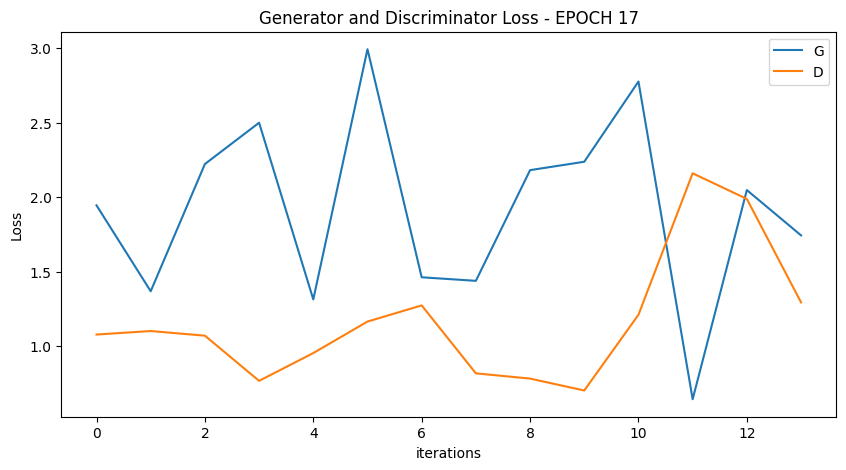

  0%|          | 0/14 [00:00<?, ?it/s]

[19/100][7/14] Loss_D: 1.3224 Loss_G: 2.3885 D(x): 0.6782 D(G(z)): 0.5068 / 0.0909
[19/100][14/14] Loss_D: 1.6005 Loss_G: 1.4250 D(x): 0.3951 D(G(z)): 0.4129 / 0.2430


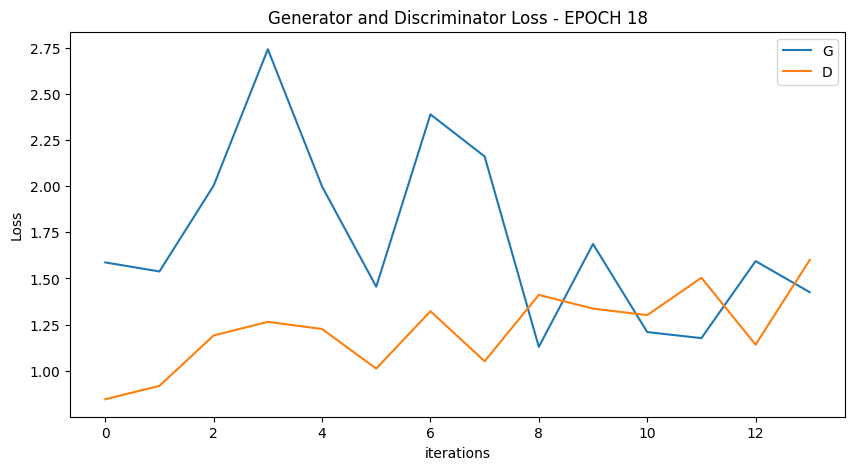

  0%|          | 0/14 [00:00<?, ?it/s]

[20/100][7/14] Loss_D: 1.2135 Loss_G: 1.6507 D(x): 0.5528 D(G(z)): 0.4113 / 0.1848
[20/100][14/14] Loss_D: 1.1949 Loss_G: 1.1177 D(x): 0.4692 D(G(z)): 0.2669 / 0.3242


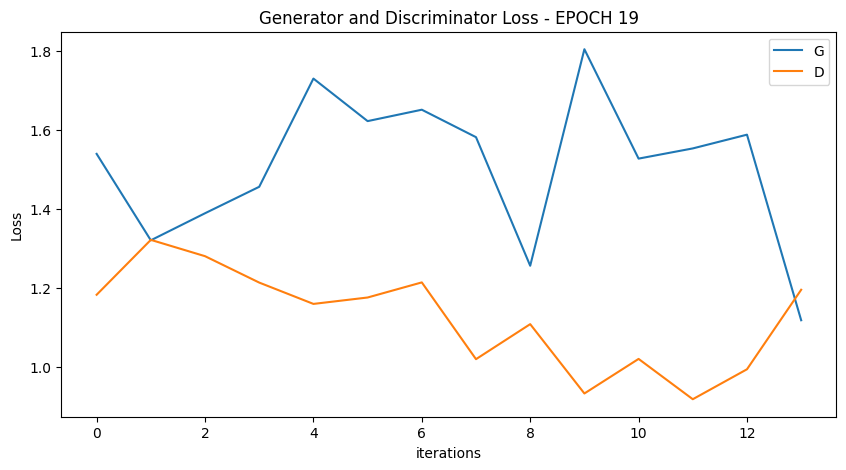

  0%|          | 0/14 [00:00<?, ?it/s]

[21/100][7/14] Loss_D: 1.2861 Loss_G: 1.8103 D(x): 0.6293 D(G(z)): 0.4999 / 0.1487
[21/100][14/14] Loss_D: 1.5097 Loss_G: 1.7563 D(x): 0.3575 D(G(z)): 0.3744 / 0.1504


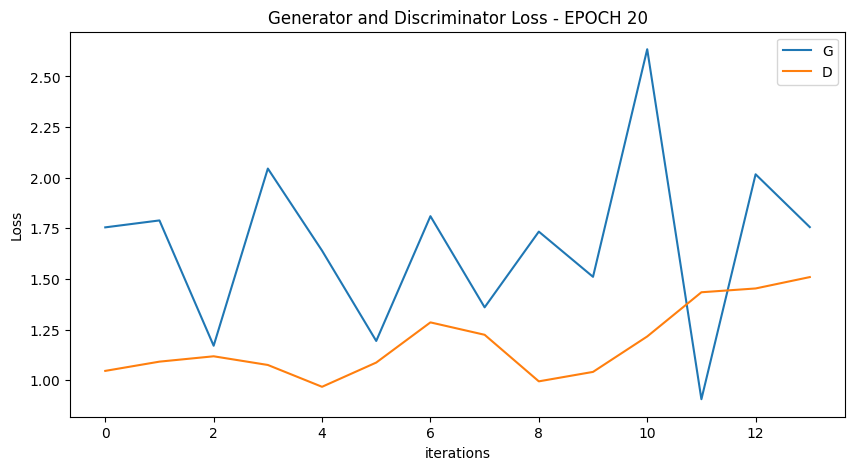

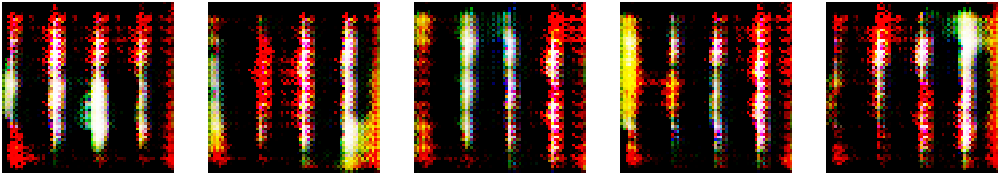

  0%|          | 0/14 [00:00<?, ?it/s]

[22/100][7/14] Loss_D: 1.3953 Loss_G: 1.1721 D(x): 0.3273 D(G(z)): 0.2431 / 0.2976
[22/100][14/14] Loss_D: 1.3869 Loss_G: 1.6956 D(x): 0.5760 D(G(z)): 0.5279 / 0.1633


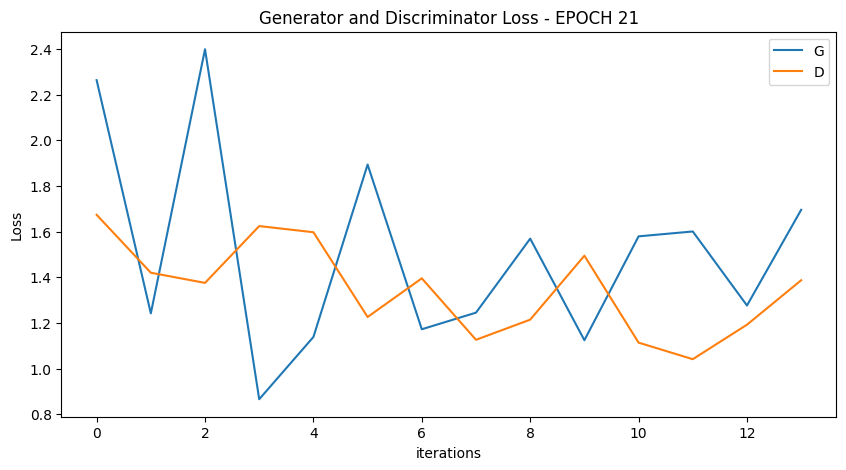

  0%|          | 0/14 [00:00<?, ?it/s]

[23/100][7/14] Loss_D: 1.2329 Loss_G: 1.6065 D(x): 0.4802 D(G(z)): 0.3510 / 0.1856
[23/100][14/14] Loss_D: 1.1071 Loss_G: 1.9842 D(x): 0.6033 D(G(z)): 0.3754 / 0.1326


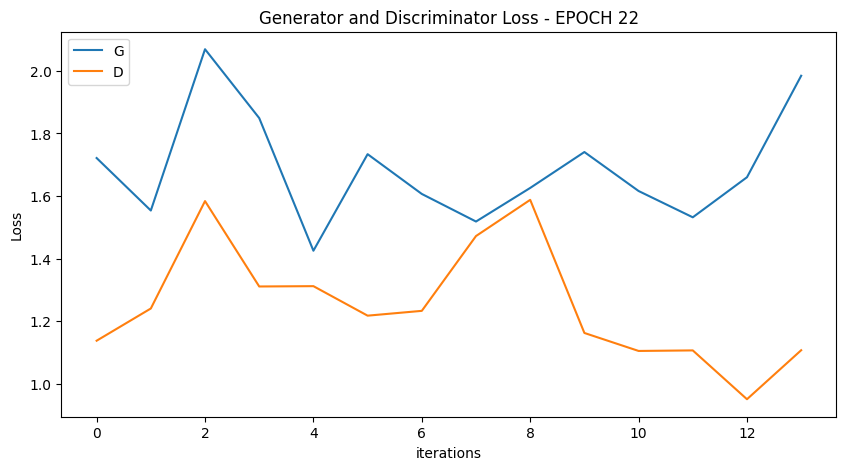

  0%|          | 0/14 [00:00<?, ?it/s]

[24/100][7/14] Loss_D: 0.9879 Loss_G: 1.7019 D(x): 0.6276 D(G(z)): 0.3402 / 0.1676
[24/100][14/14] Loss_D: 1.2595 Loss_G: 1.1218 D(x): 0.4720 D(G(z)): 0.3608 / 0.3130


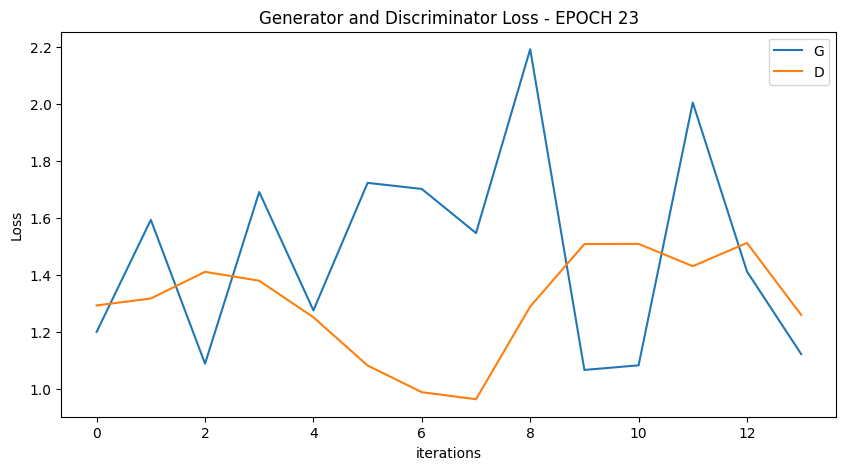

  0%|          | 0/14 [00:00<?, ?it/s]

[25/100][7/14] Loss_D: 1.3007 Loss_G: 1.1471 D(x): 0.3980 D(G(z)): 0.2725 / 0.3092
[25/100][14/14] Loss_D: 1.3518 Loss_G: 1.0617 D(x): 0.4800 D(G(z)): 0.4252 / 0.3398


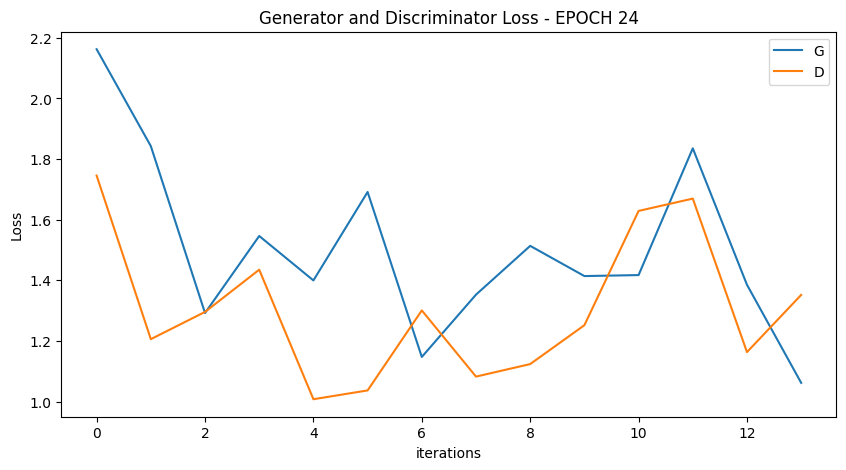

  0%|          | 0/14 [00:00<?, ?it/s]

[26/100][7/14] Loss_D: 0.9112 Loss_G: 1.5710 D(x): 0.5199 D(G(z)): 0.1957 / 0.1975
[26/100][14/14] Loss_D: 1.0489 Loss_G: 1.5040 D(x): 0.5621 D(G(z)): 0.3309 / 0.2186


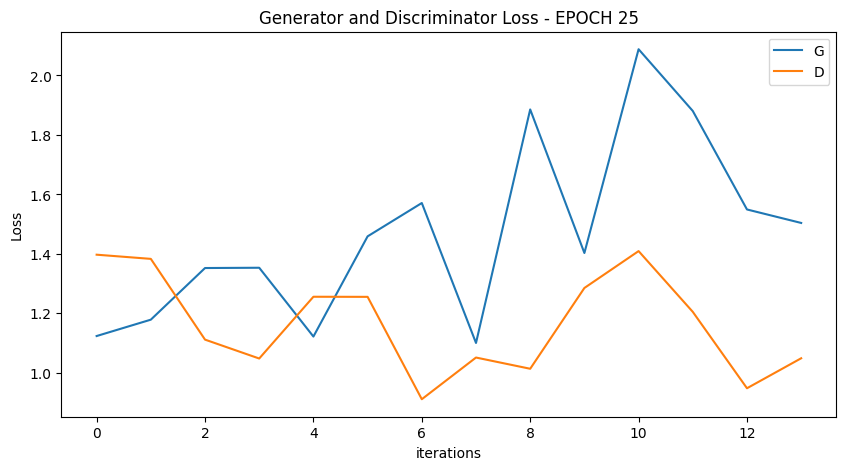

  0%|          | 0/14 [00:00<?, ?it/s]

[27/100][7/14] Loss_D: 1.2369 Loss_G: 2.1836 D(x): 0.5202 D(G(z)): 0.3648 / 0.1110
[27/100][14/14] Loss_D: 1.1287 Loss_G: 1.5022 D(x): 0.5277 D(G(z)): 0.3412 / 0.2137


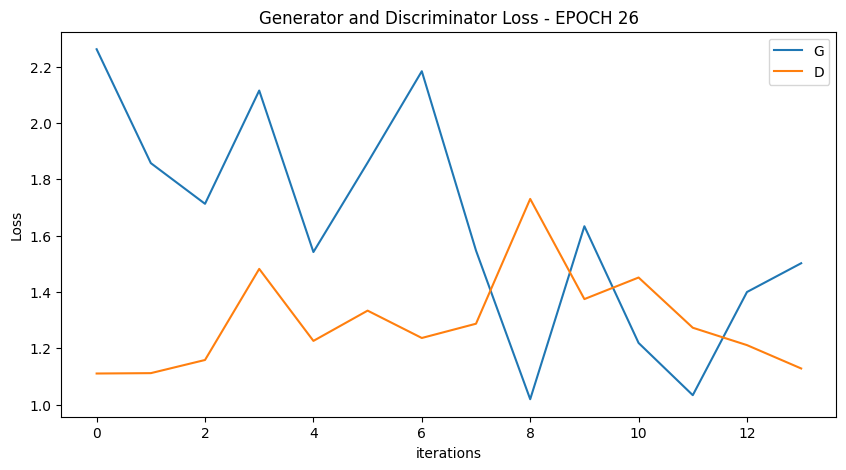

  0%|          | 0/14 [00:00<?, ?it/s]

[28/100][7/14] Loss_D: 1.1035 Loss_G: 1.9504 D(x): 0.6041 D(G(z)): 0.3905 / 0.1327
[28/100][14/14] Loss_D: 1.0010 Loss_G: 1.9449 D(x): 0.5570 D(G(z)): 0.2585 / 0.1419


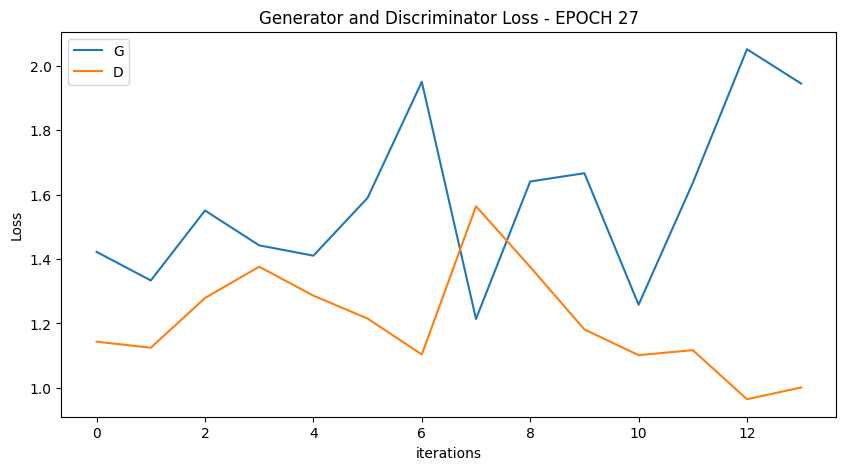

  0%|          | 0/14 [00:00<?, ?it/s]

[29/100][7/14] Loss_D: 1.2846 Loss_G: 1.6363 D(x): 0.4177 D(G(z)): 0.2690 / 0.1853
[29/100][14/14] Loss_D: 1.3435 Loss_G: 1.4017 D(x): 0.4567 D(G(z)): 0.3790 / 0.2491


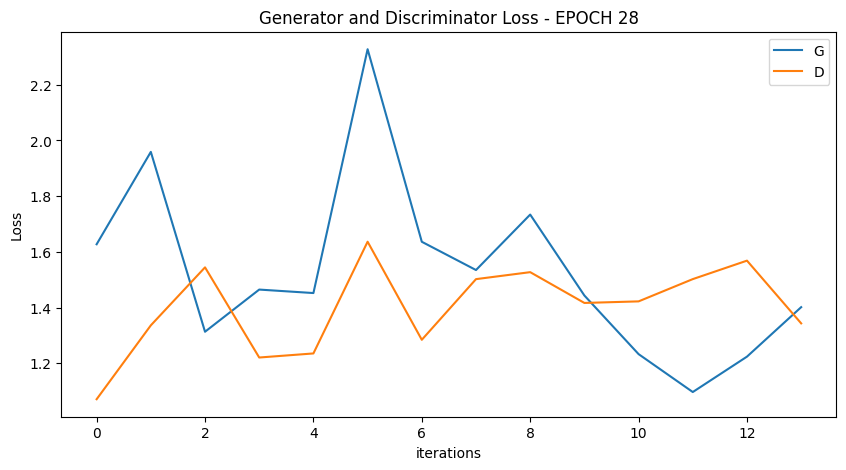

  0%|          | 0/14 [00:00<?, ?it/s]

[30/100][7/14] Loss_D: 1.3588 Loss_G: 1.0709 D(x): 0.4965 D(G(z)): 0.4269 / 0.3468
[30/100][14/14] Loss_D: 1.2279 Loss_G: 1.3616 D(x): 0.5227 D(G(z)): 0.3635 / 0.2369


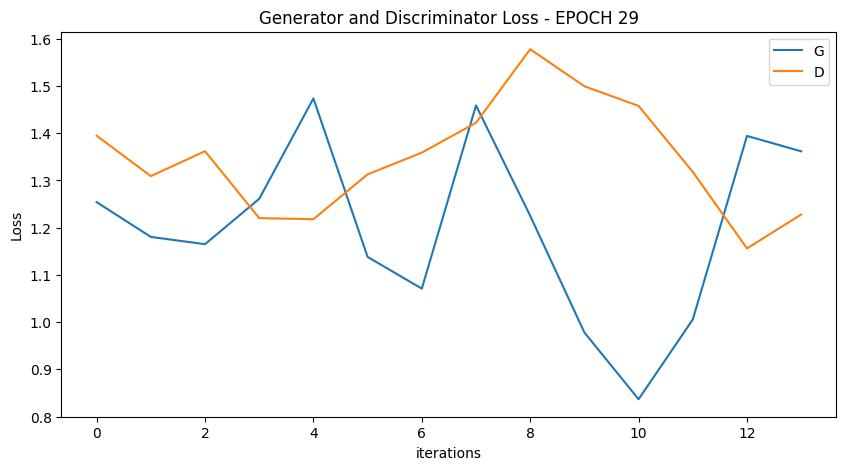

  0%|          | 0/14 [00:00<?, ?it/s]

[31/100][7/14] Loss_D: 1.0970 Loss_G: 1.2882 D(x): 0.5862 D(G(z)): 0.3622 / 0.2639
[31/100][14/14] Loss_D: 1.4825 Loss_G: 1.3318 D(x): 0.4634 D(G(z)): 0.4878 / 0.2534


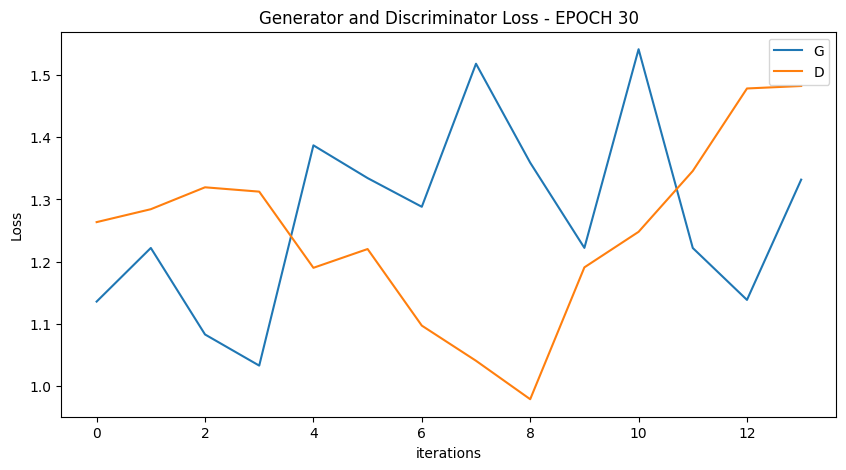

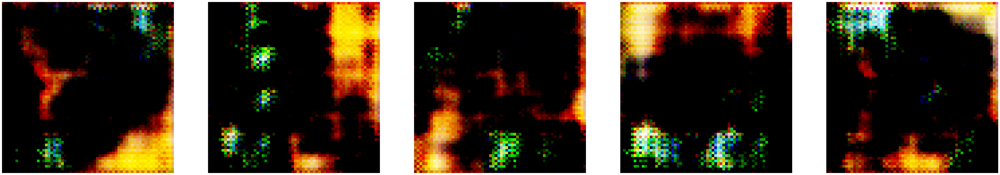

  0%|          | 0/14 [00:00<?, ?it/s]

[32/100][7/14] Loss_D: 1.4382 Loss_G: 1.1274 D(x): 0.5678 D(G(z)): 0.5210 / 0.3190
[32/100][14/14] Loss_D: 1.1344 Loss_G: 1.8163 D(x): 0.5697 D(G(z)): 0.3907 / 0.1527


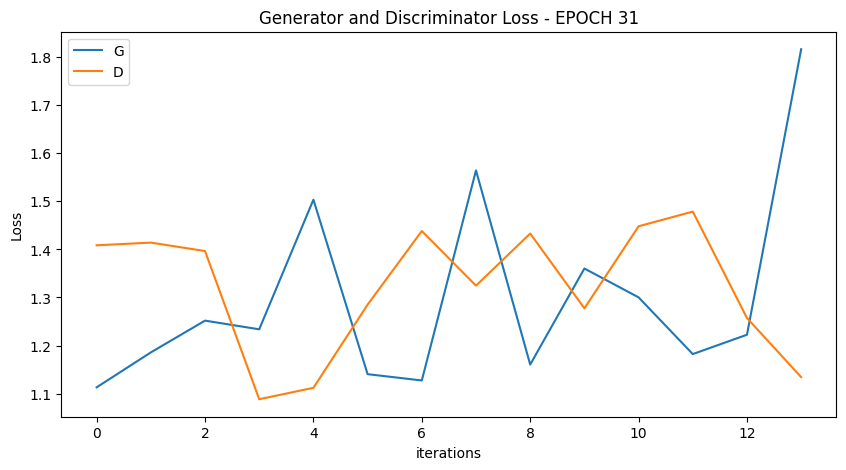

  0%|          | 0/14 [00:00<?, ?it/s]

[33/100][7/14] Loss_D: 1.1186 Loss_G: 1.4776 D(x): 0.5495 D(G(z)): 0.3464 / 0.2162
[33/100][14/14] Loss_D: 1.4273 Loss_G: 1.3891 D(x): 0.3965 D(G(z)): 0.3409 / 0.2434


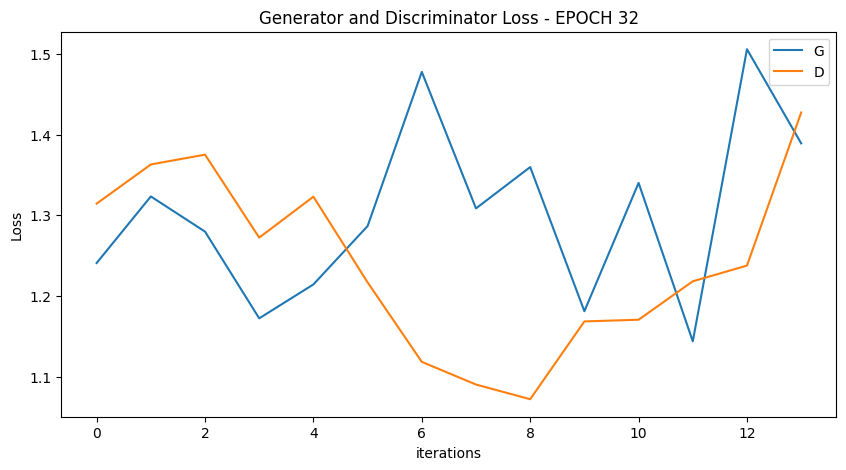

  0%|          | 0/14 [00:00<?, ?it/s]

[34/100][7/14] Loss_D: 1.2375 Loss_G: 1.5927 D(x): 0.5809 D(G(z)): 0.4427 / 0.1855
[34/100][14/14] Loss_D: 1.1743 Loss_G: 1.3974 D(x): 0.5369 D(G(z)): 0.3367 / 0.2361


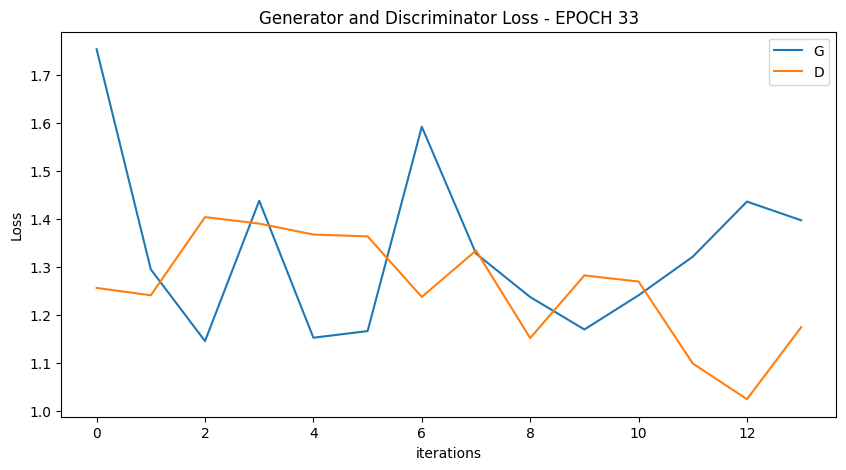

  0%|          | 0/14 [00:00<?, ?it/s]

[35/100][7/14] Loss_D: 1.3884 Loss_G: 1.9881 D(x): 0.6353 D(G(z)): 0.5291 / 0.1406
[35/100][14/14] Loss_D: 1.4146 Loss_G: 1.5863 D(x): 0.3967 D(G(z)): 0.3643 / 0.1955


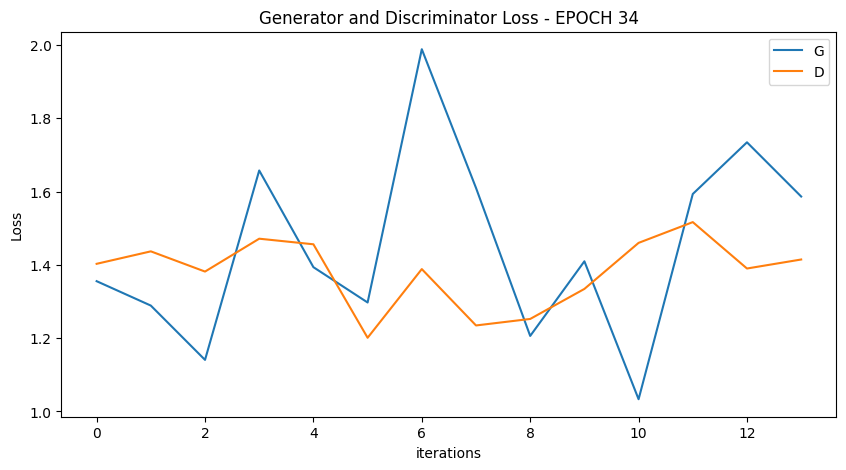

  0%|          | 0/14 [00:00<?, ?it/s]

[36/100][7/14] Loss_D: 1.4409 Loss_G: 1.0855 D(x): 0.4643 D(G(z)): 0.4372 / 0.3351
[36/100][14/14] Loss_D: 1.3222 Loss_G: 1.4289 D(x): 0.5174 D(G(z)): 0.4472 / 0.2205


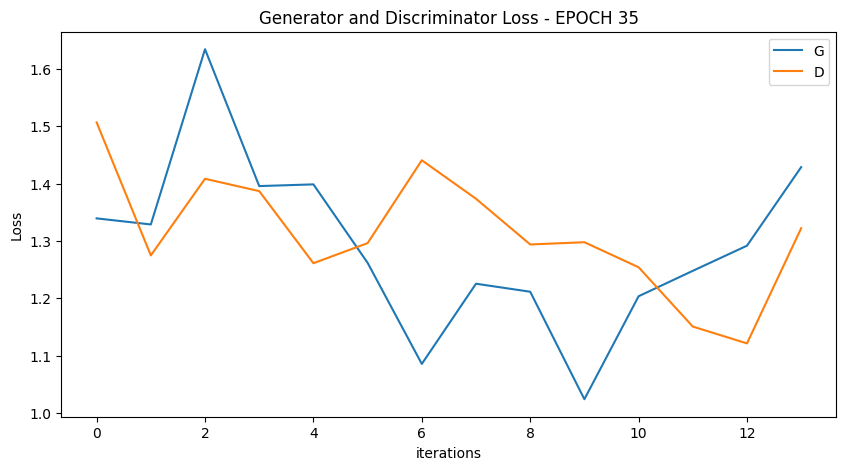

  0%|          | 0/14 [00:00<?, ?it/s]

[37/100][7/14] Loss_D: 1.4021 Loss_G: 1.4058 D(x): 0.3638 D(G(z)): 0.3060 / 0.2400
[37/100][14/14] Loss_D: 1.3467 Loss_G: 1.2552 D(x): 0.4338 D(G(z)): 0.3657 / 0.2679


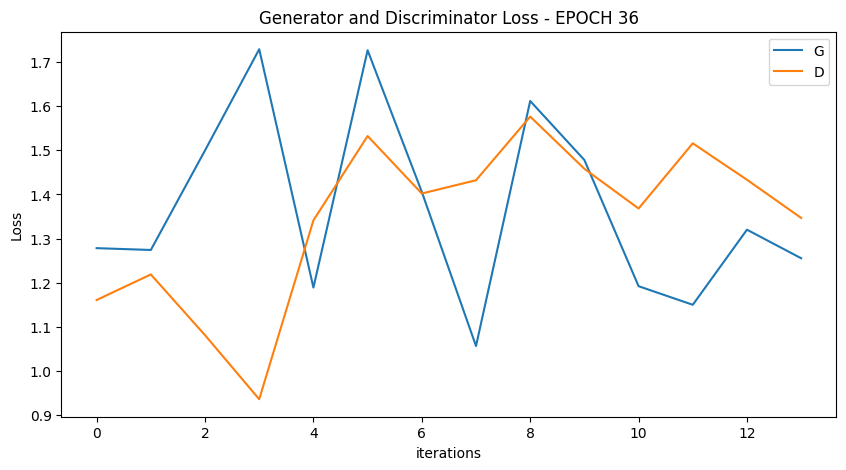

  0%|          | 0/14 [00:00<?, ?it/s]

[38/100][7/14] Loss_D: 1.2789 Loss_G: 1.3976 D(x): 0.6312 D(G(z)): 0.5050 / 0.2319
[38/100][14/14] Loss_D: 1.2383 Loss_G: 1.5403 D(x): 0.5616 D(G(z)): 0.4106 / 0.2079


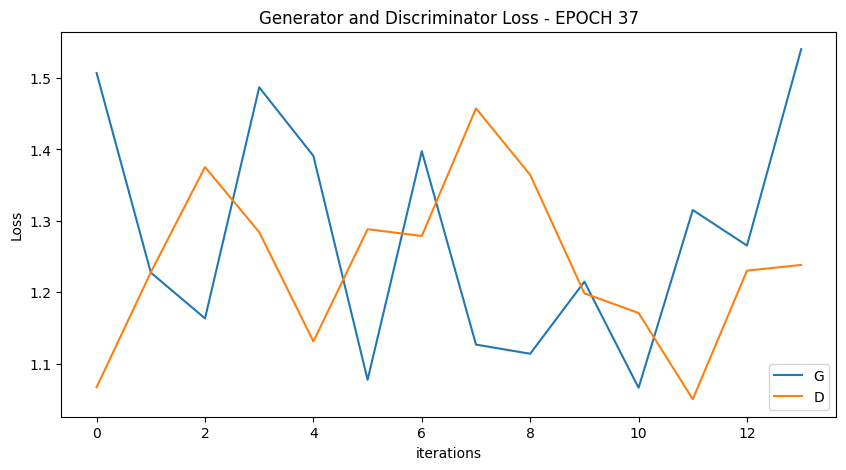

  0%|          | 0/14 [00:00<?, ?it/s]

[39/100][7/14] Loss_D: 1.1842 Loss_G: 1.5616 D(x): 0.6028 D(G(z)): 0.4397 / 0.1977
[39/100][14/14] Loss_D: 1.4281 Loss_G: 1.3376 D(x): 0.4567 D(G(z)): 0.4197 / 0.2411


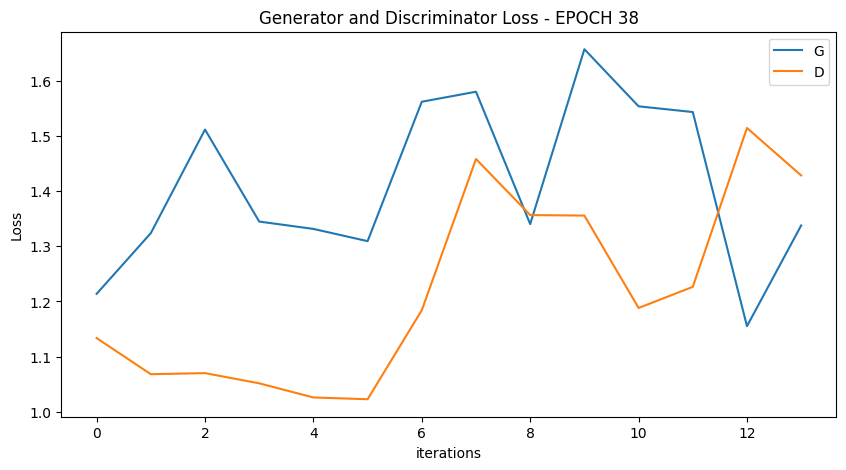

  0%|          | 0/14 [00:00<?, ?it/s]

[40/100][7/14] Loss_D: 1.1171 Loss_G: 1.1589 D(x): 0.4844 D(G(z)): 0.2850 / 0.3091
[40/100][14/14] Loss_D: 1.5371 Loss_G: 2.4301 D(x): 0.5659 D(G(z)): 0.5641 / 0.0819


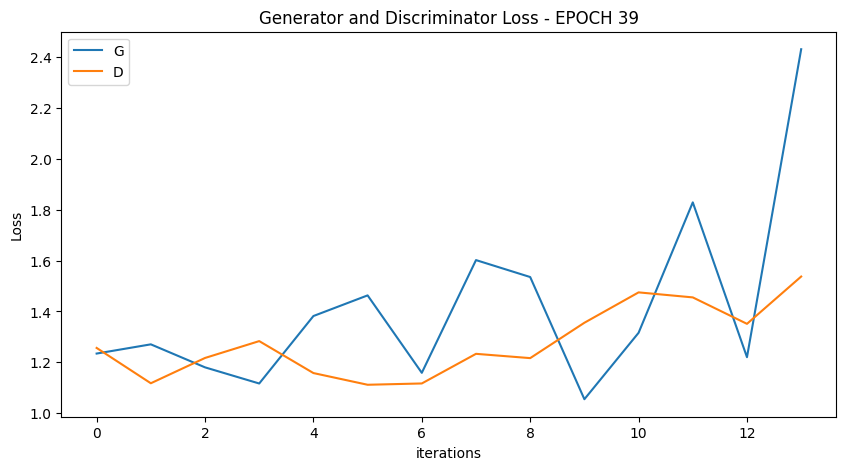

  0%|          | 0/14 [00:00<?, ?it/s]

[41/100][7/14] Loss_D: 1.2869 Loss_G: 1.6400 D(x): 0.4516 D(G(z)): 0.3451 / 0.1895
[41/100][14/14] Loss_D: 1.3181 Loss_G: 2.0157 D(x): 0.6122 D(G(z)): 0.4817 / 0.1325


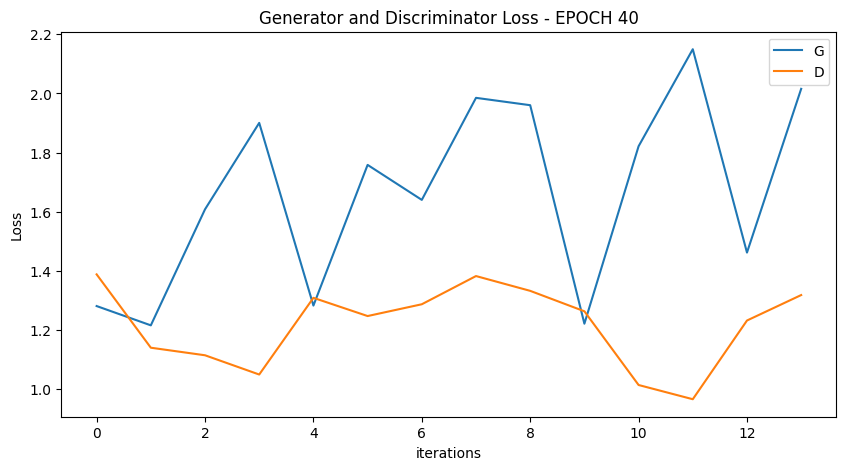

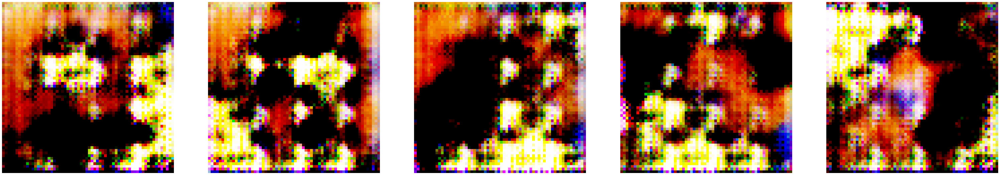

  0%|          | 0/14 [00:00<?, ?it/s]

[42/100][7/14] Loss_D: 1.6248 Loss_G: 1.0979 D(x): 0.3545 D(G(z)): 0.3901 / 0.3333
[42/100][14/14] Loss_D: 1.5582 Loss_G: 1.4801 D(x): 0.5129 D(G(z)): 0.5045 / 0.2091


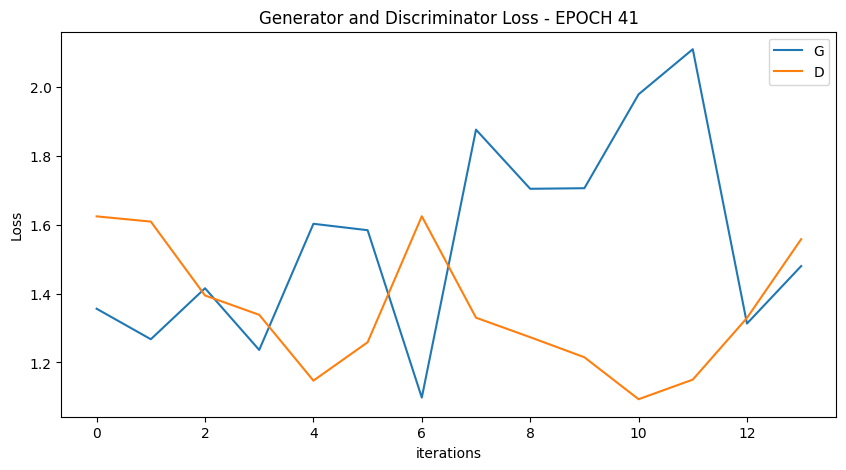

  0%|          | 0/14 [00:00<?, ?it/s]

[43/100][7/14] Loss_D: 1.2314 Loss_G: 1.7136 D(x): 0.6117 D(G(z)): 0.4676 / 0.1653
[43/100][14/14] Loss_D: 1.2367 Loss_G: 1.4801 D(x): 0.6159 D(G(z)): 0.4627 / 0.2389


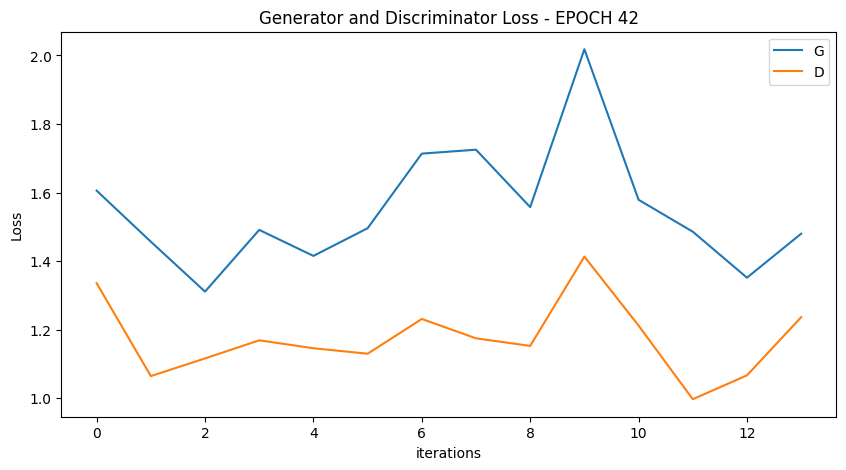

  0%|          | 0/14 [00:00<?, ?it/s]

[44/100][7/14] Loss_D: 1.1846 Loss_G: 1.6666 D(x): 0.5363 D(G(z)): 0.3748 / 0.1725
[44/100][14/14] Loss_D: 1.2437 Loss_G: 1.6397 D(x): 0.4890 D(G(z)): 0.3117 / 0.1860


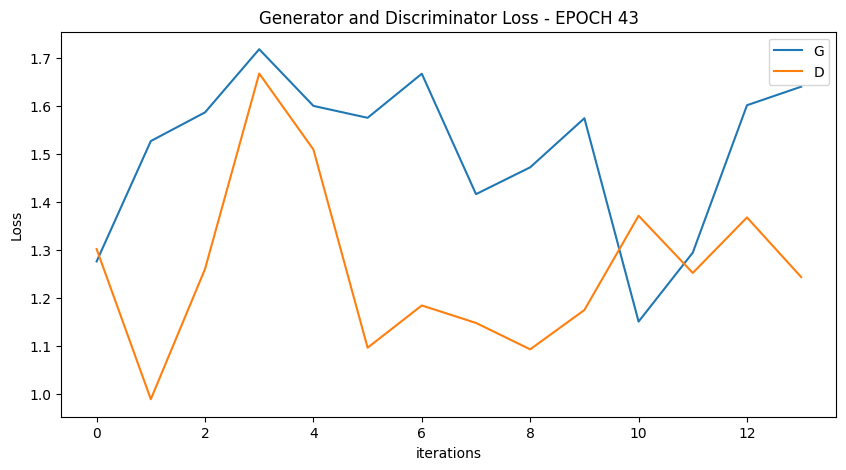

  0%|          | 0/14 [00:00<?, ?it/s]

[45/100][7/14] Loss_D: 1.4003 Loss_G: 1.6642 D(x): 0.4724 D(G(z)): 0.3809 / 0.1821
[45/100][14/14] Loss_D: 1.1313 Loss_G: 1.7472 D(x): 0.6396 D(G(z)): 0.4066 / 0.1754


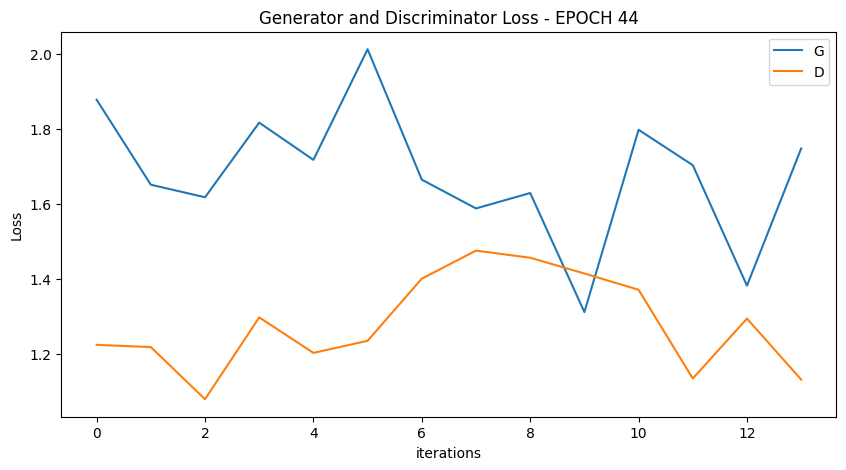

  0%|          | 0/14 [00:00<?, ?it/s]

[46/100][7/14] Loss_D: 1.4297 Loss_G: 1.1512 D(x): 0.4194 D(G(z)): 0.3832 / 0.3092
[46/100][14/14] Loss_D: 1.2303 Loss_G: 1.6568 D(x): 0.3954 D(G(z)): 0.2386 / 0.1795


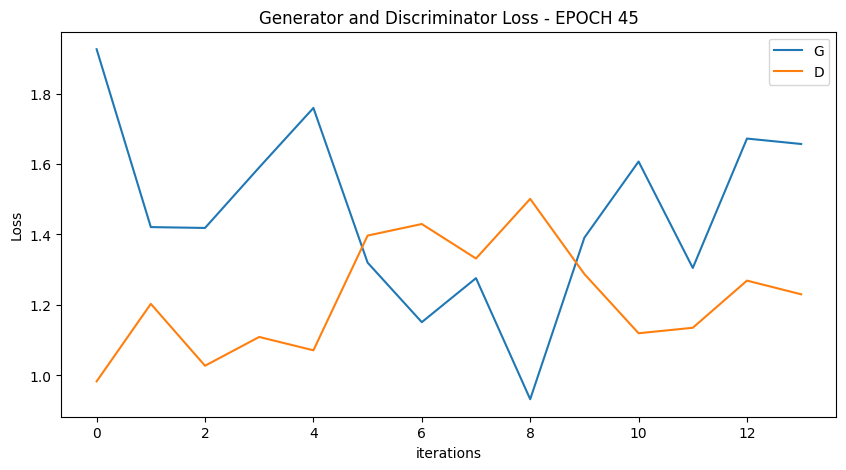

  0%|          | 0/14 [00:00<?, ?it/s]

[47/100][7/14] Loss_D: 1.2643 Loss_G: 1.2461 D(x): 0.4887 D(G(z)): 0.3698 / 0.2790
[47/100][14/14] Loss_D: 1.0655 Loss_G: 1.4567 D(x): 0.5231 D(G(z)): 0.3014 / 0.2220


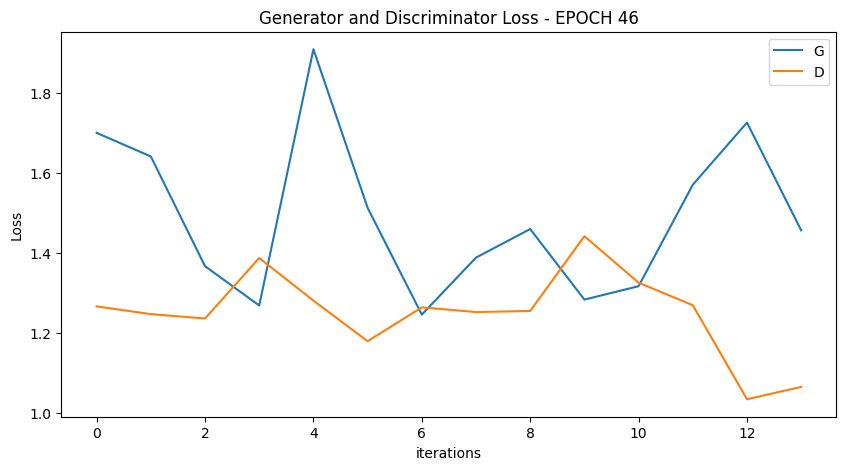

  0%|          | 0/14 [00:00<?, ?it/s]

[48/100][7/14] Loss_D: 1.4657 Loss_G: 1.6902 D(x): 0.6229 D(G(z)): 0.5719 / 0.1727
[48/100][14/14] Loss_D: 1.3039 Loss_G: 1.6236 D(x): 0.4583 D(G(z)): 0.3603 / 0.1865


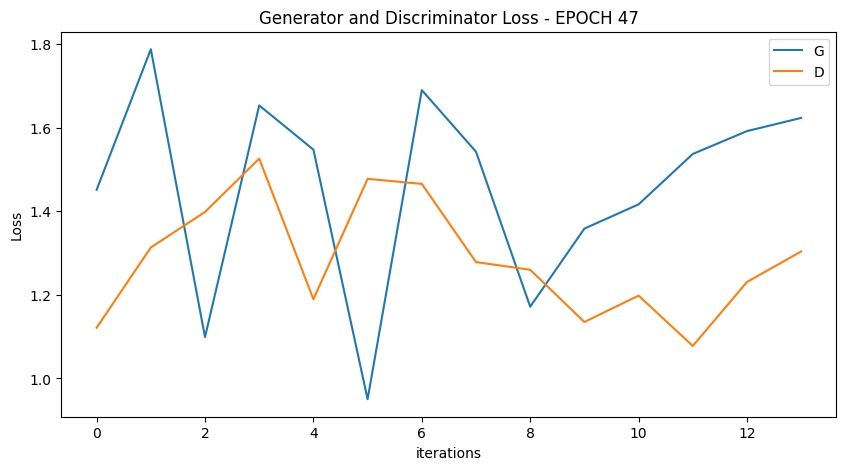

  0%|          | 0/14 [00:00<?, ?it/s]

[49/100][7/14] Loss_D: 1.1083 Loss_G: 1.6110 D(x): 0.6431 D(G(z)): 0.4264 / 0.1868
[49/100][14/14] Loss_D: 1.2605 Loss_G: 1.6010 D(x): 0.5985 D(G(z)): 0.4461 / 0.1817


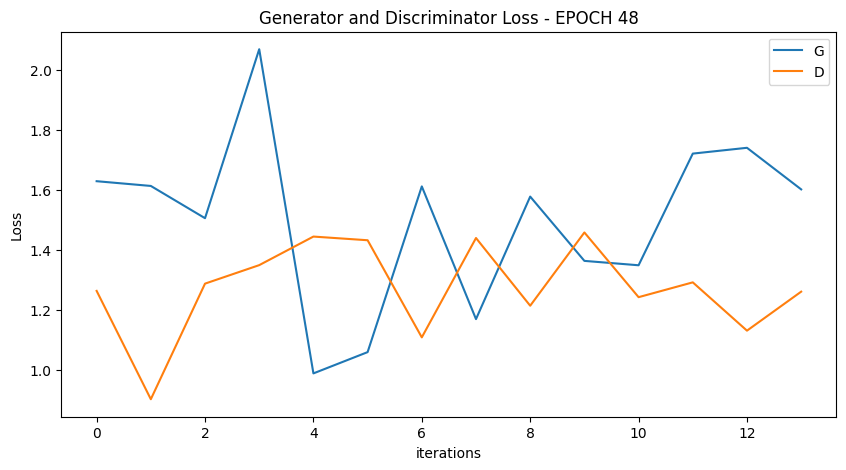

  0%|          | 0/14 [00:00<?, ?it/s]

[50/100][7/14] Loss_D: 1.0795 Loss_G: 1.7049 D(x): 0.5308 D(G(z)): 0.3144 / 0.1637
[50/100][14/14] Loss_D: 1.2118 Loss_G: 1.1991 D(x): 0.4188 D(G(z)): 0.2356 / 0.2893


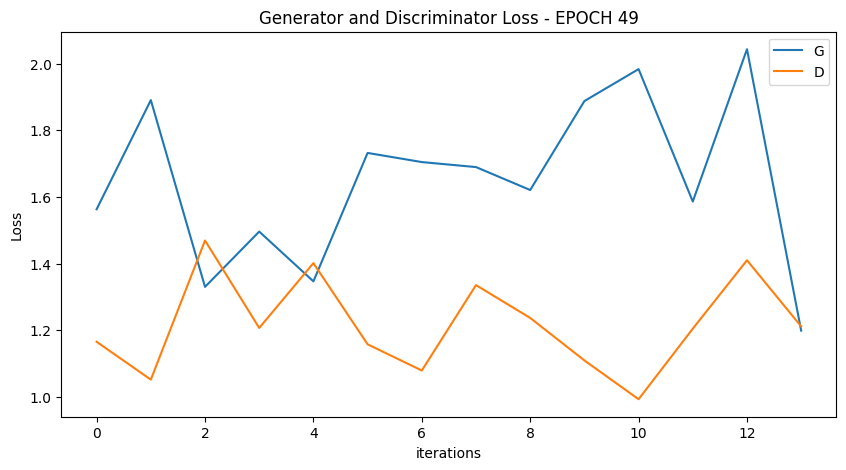

  0%|          | 0/14 [00:00<?, ?it/s]

[51/100][7/14] Loss_D: 1.0504 Loss_G: 1.7281 D(x): 0.6639 D(G(z)): 0.3912 / 0.1595
[51/100][14/14] Loss_D: 1.1789 Loss_G: 1.7022 D(x): 0.5398 D(G(z)): 0.3790 / 0.1649


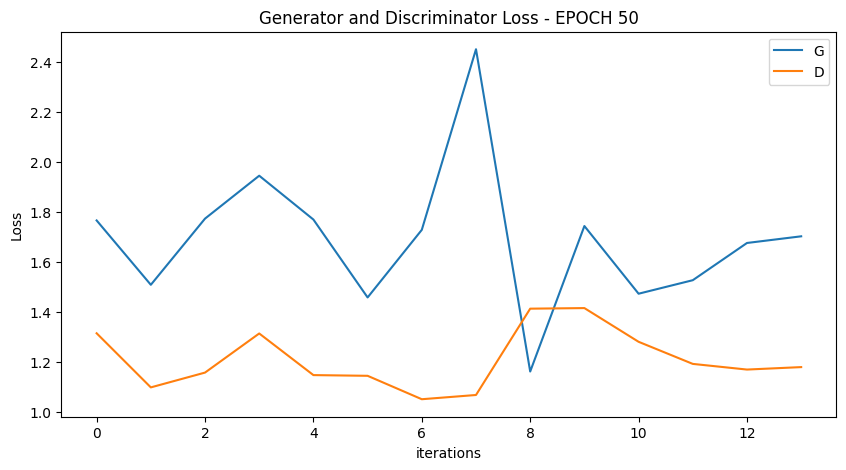

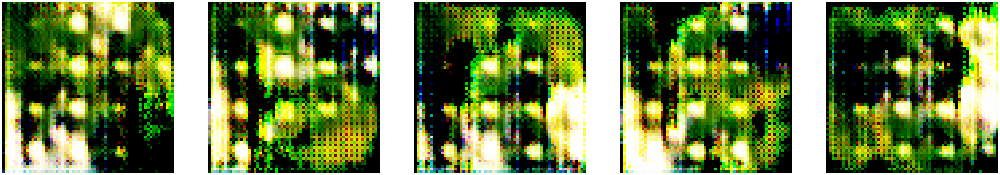

  0%|          | 0/14 [00:00<?, ?it/s]

[52/100][7/14] Loss_D: 1.2544 Loss_G: 2.2560 D(x): 0.6804 D(G(z)): 0.5145 / 0.0963
[52/100][14/14] Loss_D: 1.0569 Loss_G: 1.8037 D(x): 0.6428 D(G(z)): 0.3931 / 0.1489


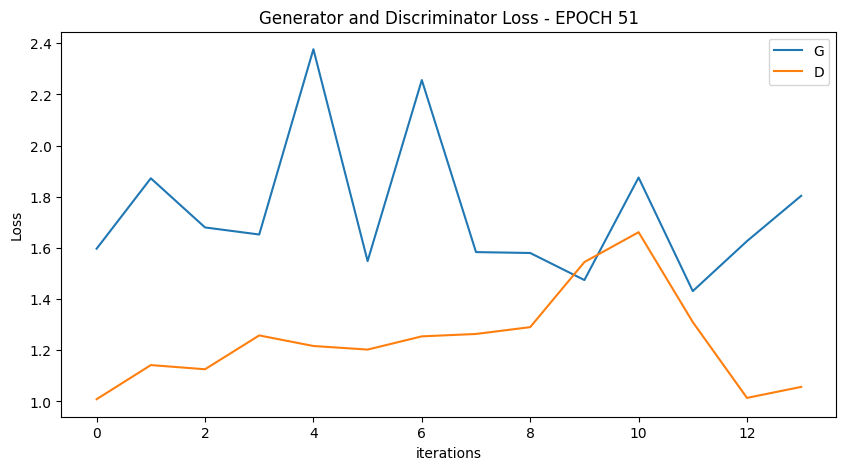

  0%|          | 0/14 [00:00<?, ?it/s]

[53/100][7/14] Loss_D: 1.4104 Loss_G: 1.4544 D(x): 0.3810 D(G(z)): 0.3235 / 0.2200
[53/100][14/14] Loss_D: 0.9365 Loss_G: 1.8091 D(x): 0.6531 D(G(z)): 0.3375 / 0.1549


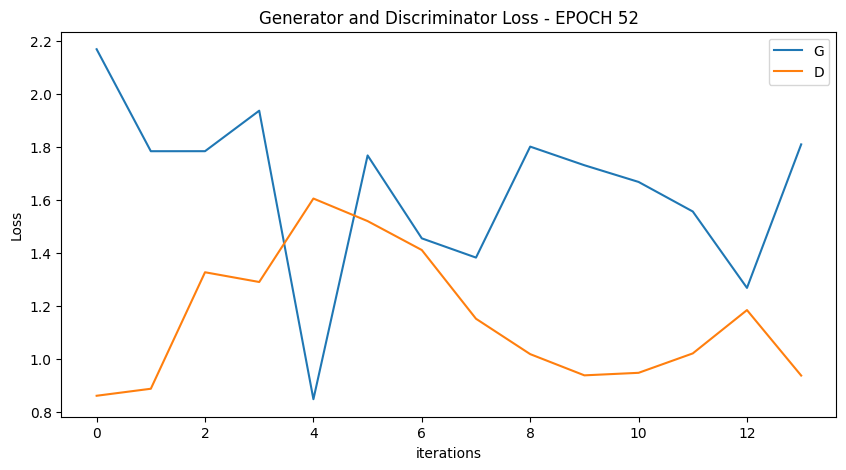

  0%|          | 0/14 [00:00<?, ?it/s]

[54/100][7/14] Loss_D: 1.2784 Loss_G: 2.0951 D(x): 0.7923 D(G(z)): 0.5707 / 0.1105
[54/100][14/14] Loss_D: 1.2961 Loss_G: 1.3619 D(x): 0.4244 D(G(z)): 0.2798 / 0.2445


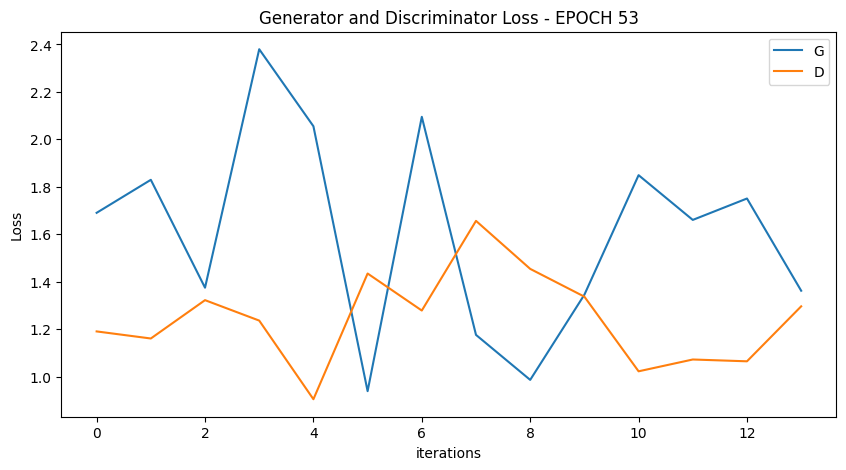

  0%|          | 0/14 [00:00<?, ?it/s]

[55/100][7/14] Loss_D: 1.4552 Loss_G: 1.2538 D(x): 0.4051 D(G(z)): 0.3923 / 0.2745
[55/100][14/14] Loss_D: 1.3623 Loss_G: 1.2365 D(x): 0.5032 D(G(z)): 0.4539 / 0.2735


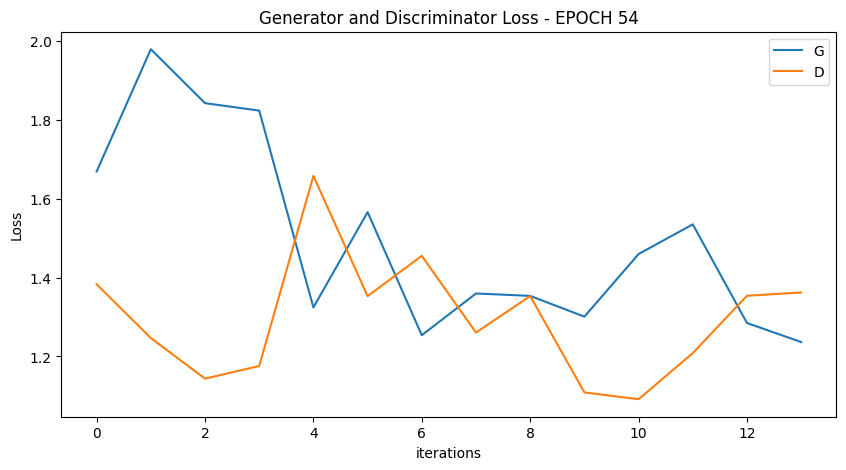

  0%|          | 0/14 [00:00<?, ?it/s]

[56/100][7/14] Loss_D: 1.3828 Loss_G: 1.5621 D(x): 0.4069 D(G(z)): 0.3658 / 0.1922
[56/100][14/14] Loss_D: 1.0664 Loss_G: 1.6437 D(x): 0.5869 D(G(z)): 0.3549 / 0.1819


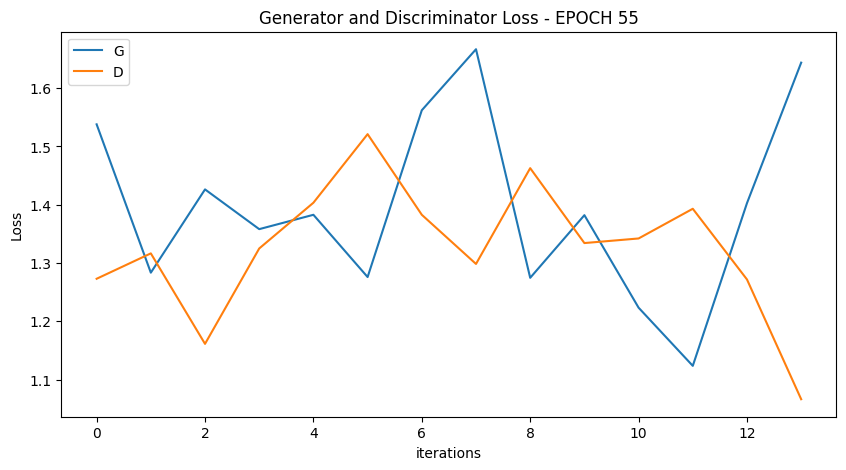

  0%|          | 0/14 [00:00<?, ?it/s]

[57/100][7/14] Loss_D: 1.1628 Loss_G: 1.8856 D(x): 0.5793 D(G(z)): 0.4147 / 0.1380
[57/100][14/14] Loss_D: 1.1405 Loss_G: 1.6007 D(x): 0.4502 D(G(z)): 0.2510 / 0.1981


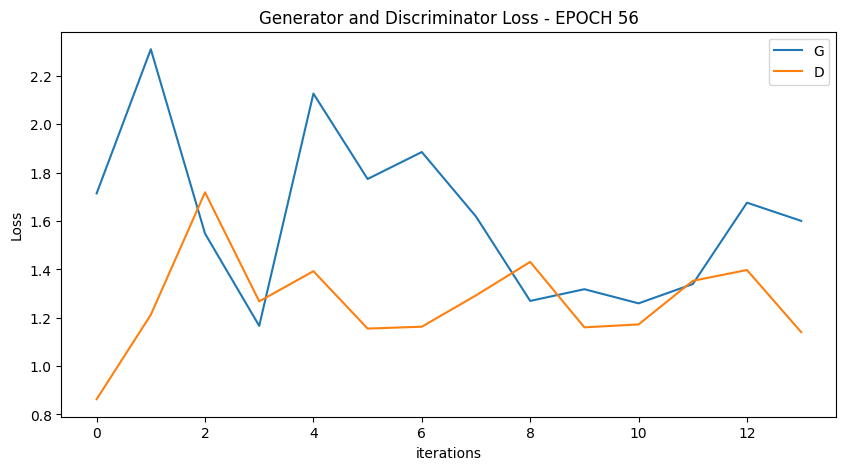

  0%|          | 0/14 [00:00<?, ?it/s]

[58/100][7/14] Loss_D: 1.5402 Loss_G: 1.2790 D(x): 0.2971 D(G(z)): 0.2401 / 0.2747
[58/100][14/14] Loss_D: 1.3169 Loss_G: 1.3885 D(x): 0.4608 D(G(z)): 0.3702 / 0.2339


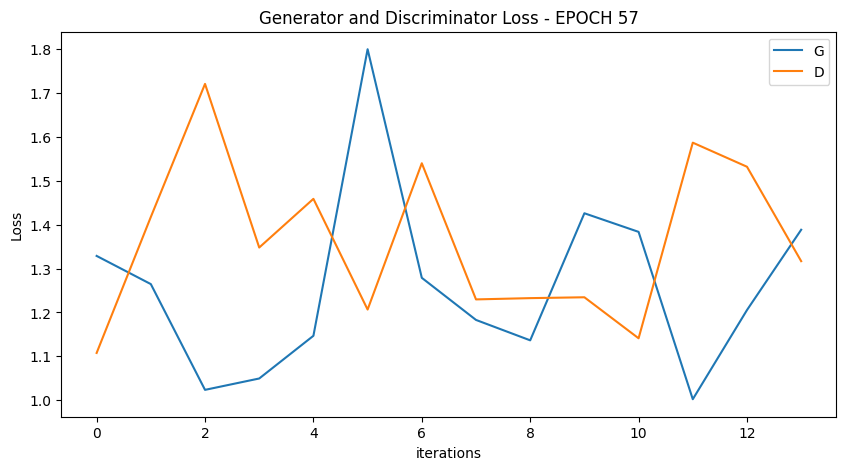

  0%|          | 0/14 [00:00<?, ?it/s]

[59/100][7/14] Loss_D: 1.2525 Loss_G: 1.5905 D(x): 0.5407 D(G(z)): 0.4256 / 0.1922
[59/100][14/14] Loss_D: 1.4481 Loss_G: 1.8614 D(x): 0.5532 D(G(z)): 0.5030 / 0.1450


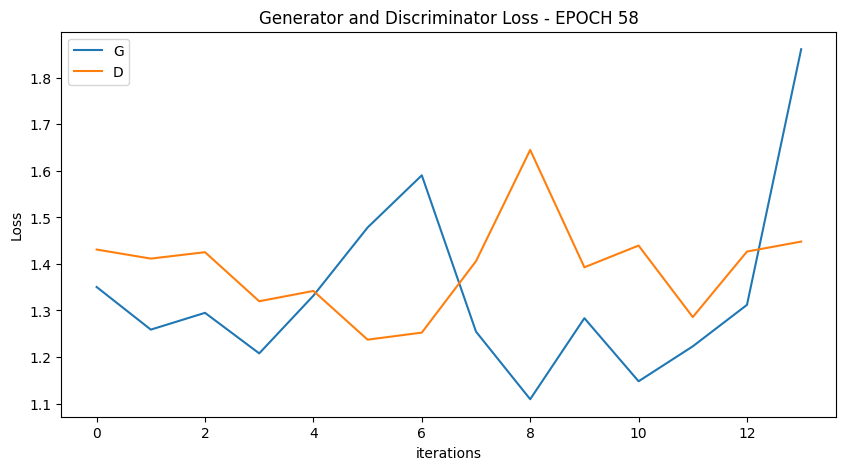

  0%|          | 0/14 [00:00<?, ?it/s]

[60/100][7/14] Loss_D: 1.3531 Loss_G: 1.2946 D(x): 0.4803 D(G(z)): 0.4244 / 0.2658
[60/100][14/14] Loss_D: 1.2114 Loss_G: 1.2612 D(x): 0.4840 D(G(z)): 0.3512 / 0.2727


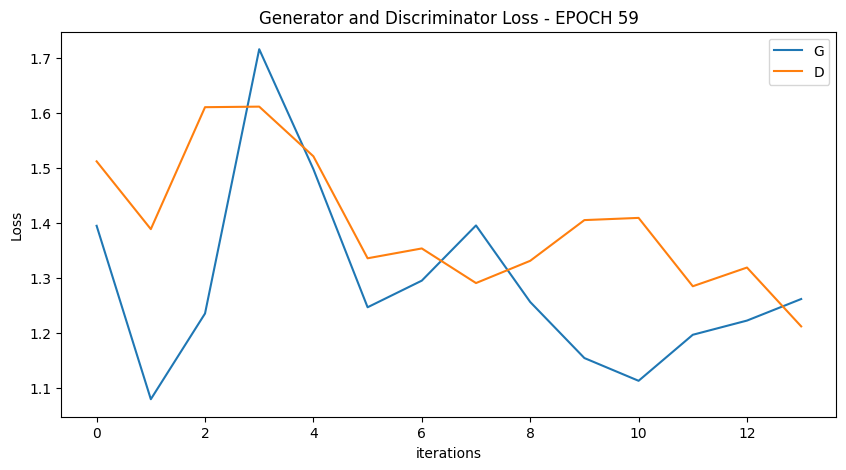

  0%|          | 0/14 [00:00<?, ?it/s]

[61/100][7/14] Loss_D: 1.4306 Loss_G: 1.0270 D(x): 0.4319 D(G(z)): 0.4184 / 0.3582
[61/100][14/14] Loss_D: 1.3973 Loss_G: 1.0937 D(x): 0.4618 D(G(z)): 0.4275 / 0.3259


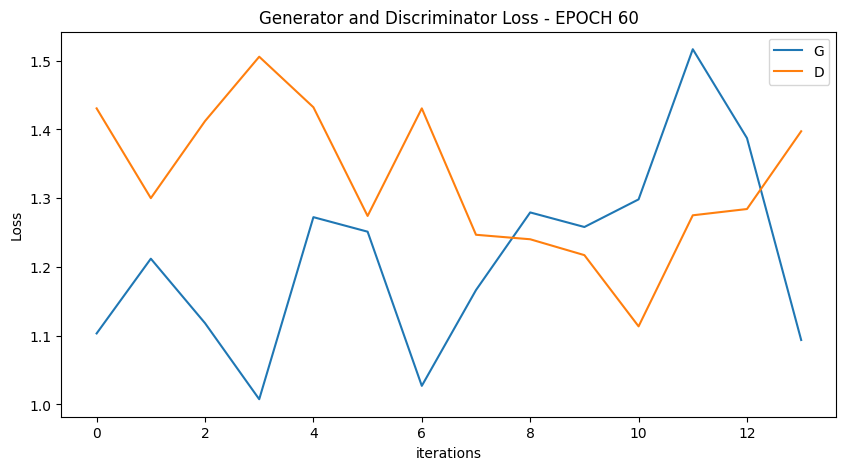

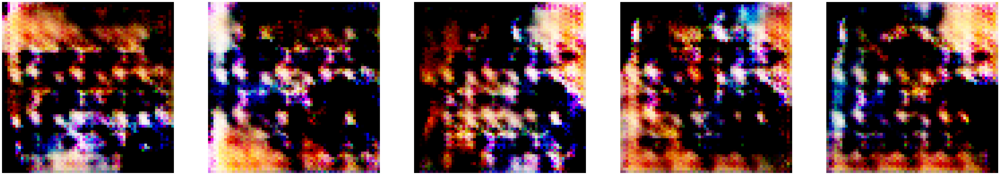

  0%|          | 0/14 [00:00<?, ?it/s]

[62/100][7/14] Loss_D: 1.3956 Loss_G: 1.2644 D(x): 0.4402 D(G(z)): 0.4136 / 0.2731
[62/100][14/14] Loss_D: 1.1059 Loss_G: 1.3562 D(x): 0.4931 D(G(z)): 0.3097 / 0.2414


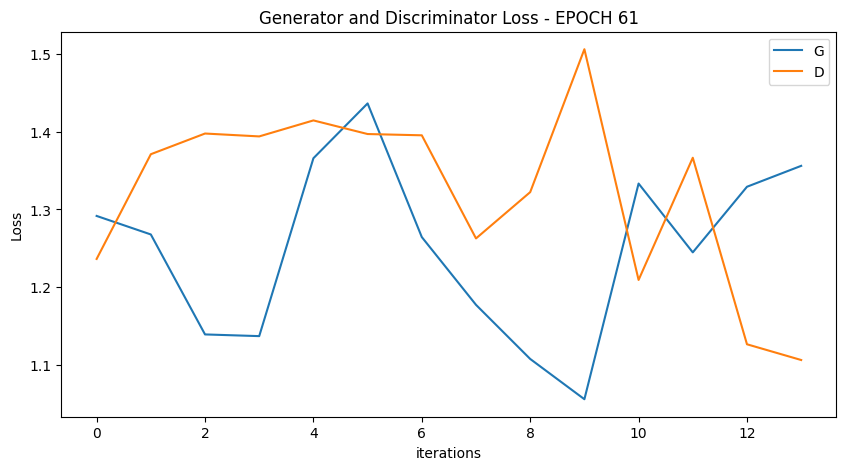

  0%|          | 0/14 [00:00<?, ?it/s]

[63/100][7/14] Loss_D: 1.1959 Loss_G: 1.3324 D(x): 0.4685 D(G(z)): 0.3241 / 0.2560
[63/100][14/14] Loss_D: 1.3266 Loss_G: 1.6510 D(x): 0.4629 D(G(z)): 0.4040 / 0.1846


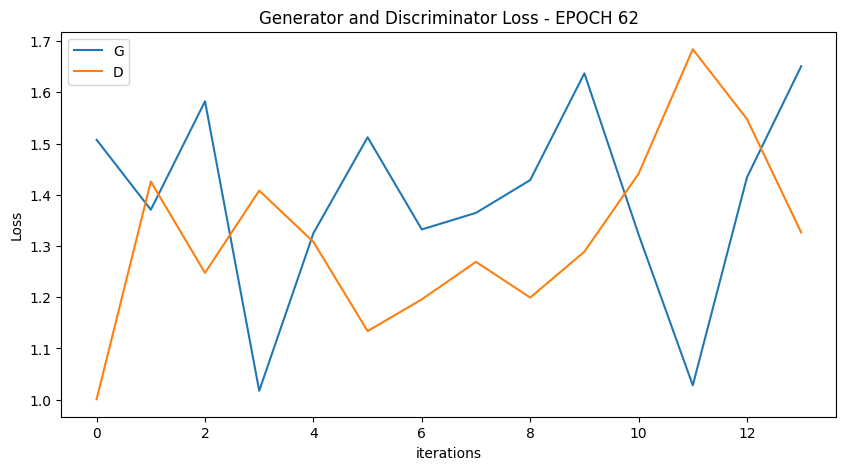

  0%|          | 0/14 [00:00<?, ?it/s]

[64/100][7/14] Loss_D: 1.3482 Loss_G: 1.2088 D(x): 0.4606 D(G(z)): 0.4087 / 0.2878
[64/100][14/14] Loss_D: 1.3185 Loss_G: 1.4207 D(x): 0.4881 D(G(z)): 0.4206 / 0.2349


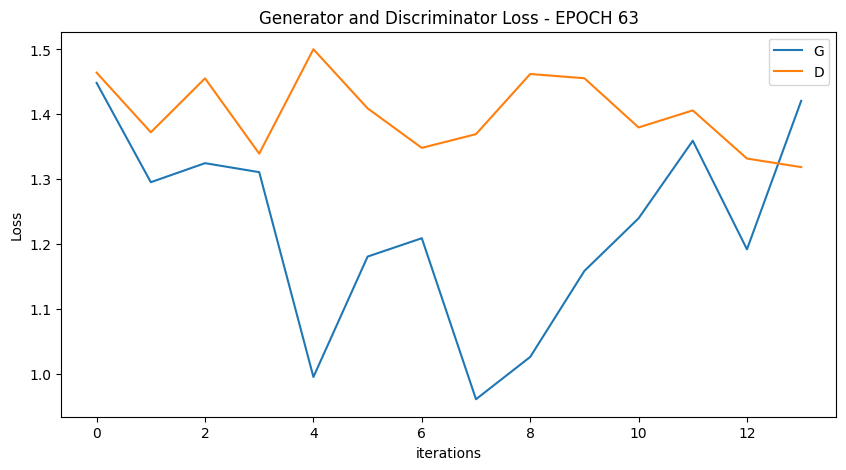

  0%|          | 0/14 [00:00<?, ?it/s]

[65/100][7/14] Loss_D: 1.2860 Loss_G: 1.4766 D(x): 0.4493 D(G(z)): 0.3511 / 0.2194
[65/100][14/14] Loss_D: 1.2297 Loss_G: 1.3788 D(x): 0.5368 D(G(z)): 0.3986 / 0.2457


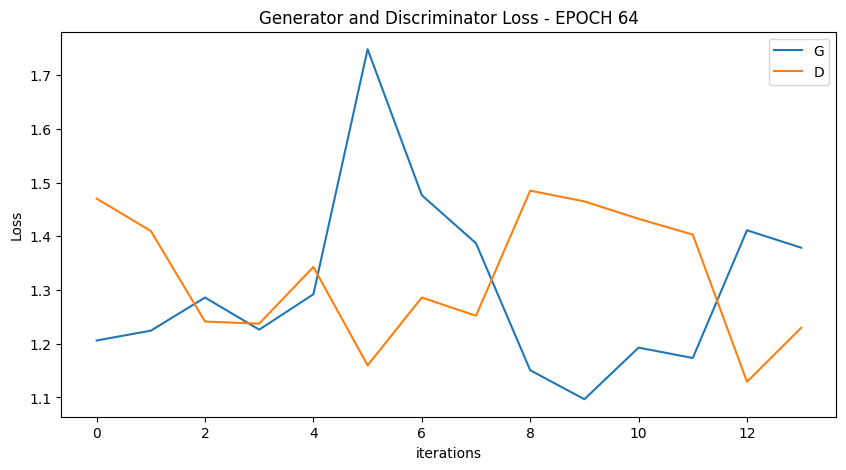

  0%|          | 0/14 [00:00<?, ?it/s]

[66/100][7/14] Loss_D: 1.4855 Loss_G: 1.6235 D(x): 0.5392 D(G(z)): 0.5280 / 0.1885
[66/100][14/14] Loss_D: 1.3490 Loss_G: 1.3687 D(x): 0.6147 D(G(z)): 0.5296 / 0.2406


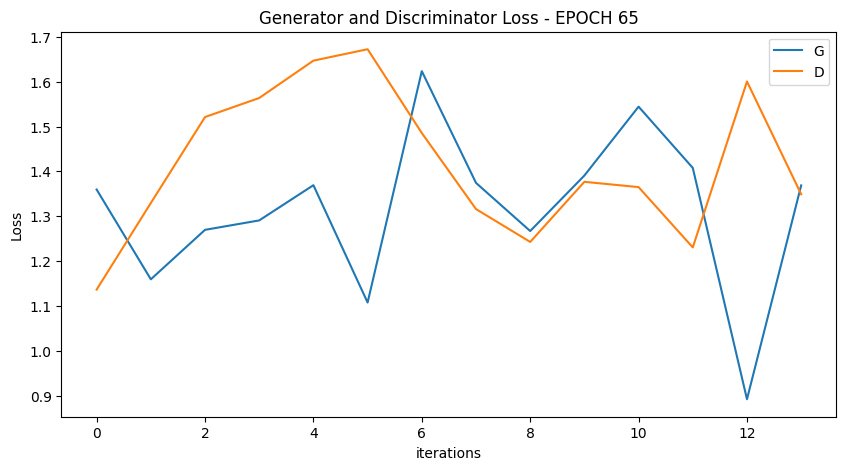

  0%|          | 0/14 [00:00<?, ?it/s]

[67/100][7/14] Loss_D: 1.2552 Loss_G: 1.2020 D(x): 0.4758 D(G(z)): 0.3638 / 0.2928
[67/100][14/14] Loss_D: 1.1185 Loss_G: 1.5623 D(x): 0.5642 D(G(z)): 0.3677 / 0.2073


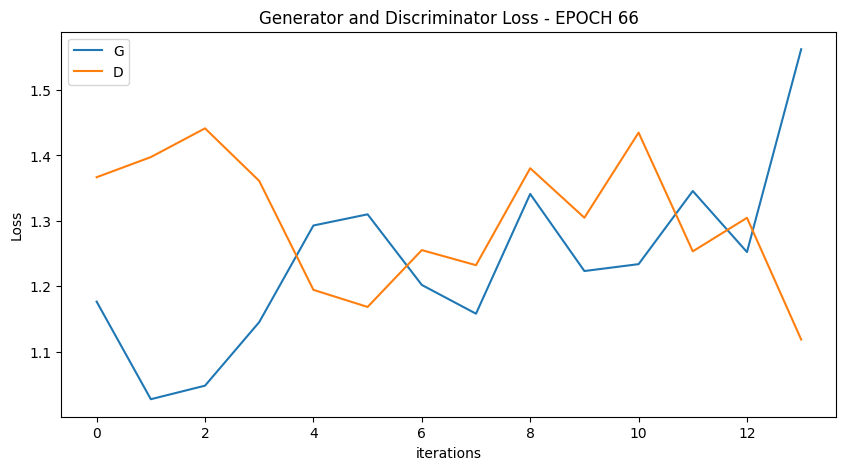

  0%|          | 0/14 [00:00<?, ?it/s]

[68/100][7/14] Loss_D: 1.4380 Loss_G: 1.0747 D(x): 0.4651 D(G(z)): 0.4377 / 0.3333
[68/100][14/14] Loss_D: 1.4769 Loss_G: 1.0908 D(x): 0.4950 D(G(z)): 0.5072 / 0.3151


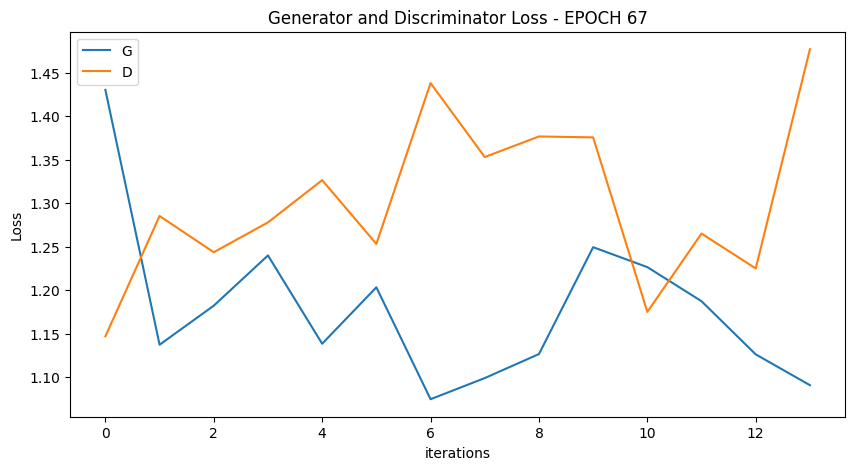

  0%|          | 0/14 [00:00<?, ?it/s]

[69/100][7/14] Loss_D: 1.3050 Loss_G: 1.0673 D(x): 0.5065 D(G(z)): 0.4319 / 0.3368
[69/100][14/14] Loss_D: 1.3923 Loss_G: 1.4354 D(x): 0.5280 D(G(z)): 0.4675 / 0.2261


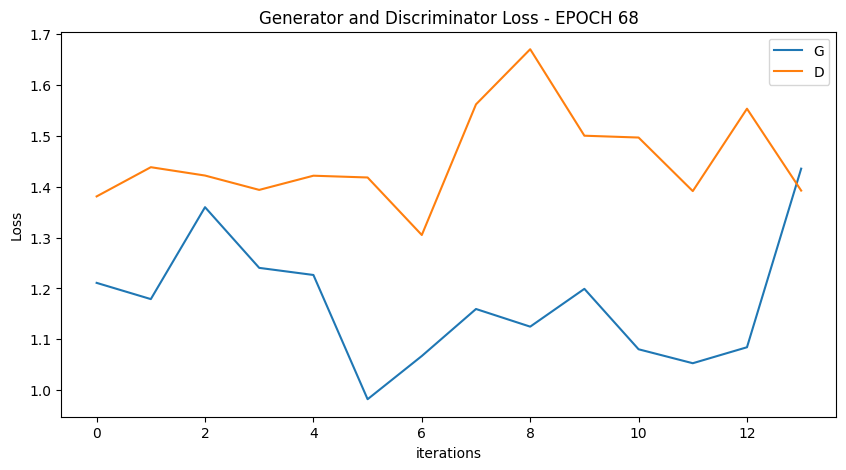

  0%|          | 0/14 [00:00<?, ?it/s]

[70/100][7/14] Loss_D: 1.3890 Loss_G: 1.3181 D(x): 0.4434 D(G(z)): 0.3803 / 0.2651
[70/100][14/14] Loss_D: 1.2753 Loss_G: 1.3626 D(x): 0.5582 D(G(z)): 0.4418 / 0.2409


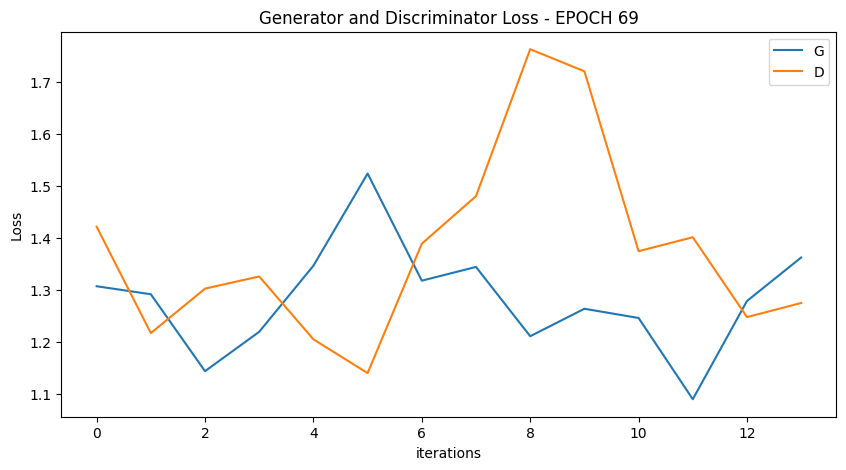

  0%|          | 0/14 [00:00<?, ?it/s]

[71/100][7/14] Loss_D: 1.0042 Loss_G: 1.2734 D(x): 0.5620 D(G(z)): 0.3064 / 0.2652
[71/100][14/14] Loss_D: 1.5214 Loss_G: 1.0467 D(x): 0.4422 D(G(z)): 0.4657 / 0.3484


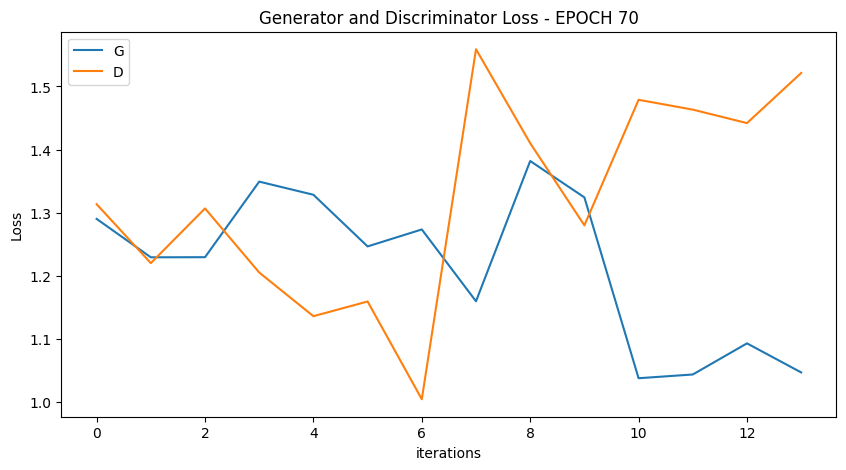

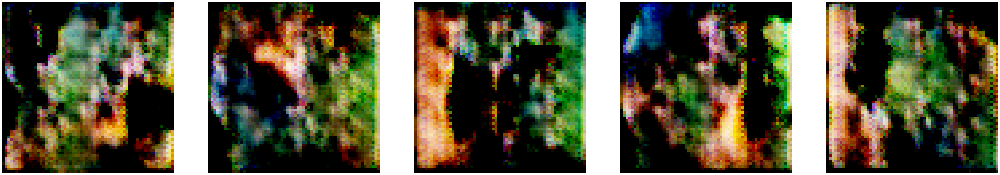

  0%|          | 0/14 [00:00<?, ?it/s]

[72/100][7/14] Loss_D: 1.2045 Loss_G: 1.3301 D(x): 0.6162 D(G(z)): 0.4591 / 0.2521
[72/100][14/14] Loss_D: 1.4040 Loss_G: 1.3221 D(x): 0.4737 D(G(z)): 0.4484 / 0.2488


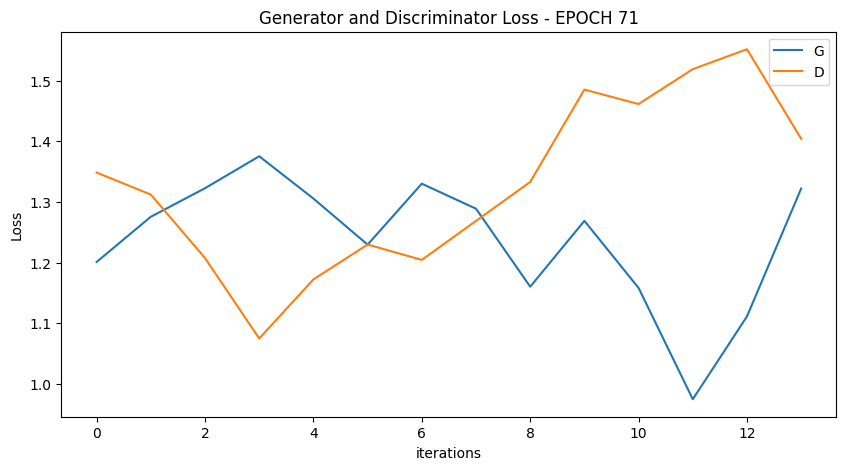

  0%|          | 0/14 [00:00<?, ?it/s]

[73/100][7/14] Loss_D: 1.4278 Loss_G: 1.2481 D(x): 0.4791 D(G(z)): 0.4775 / 0.2672
[73/100][14/14] Loss_D: 1.2019 Loss_G: 1.5388 D(x): 0.5101 D(G(z)): 0.3559 / 0.2045


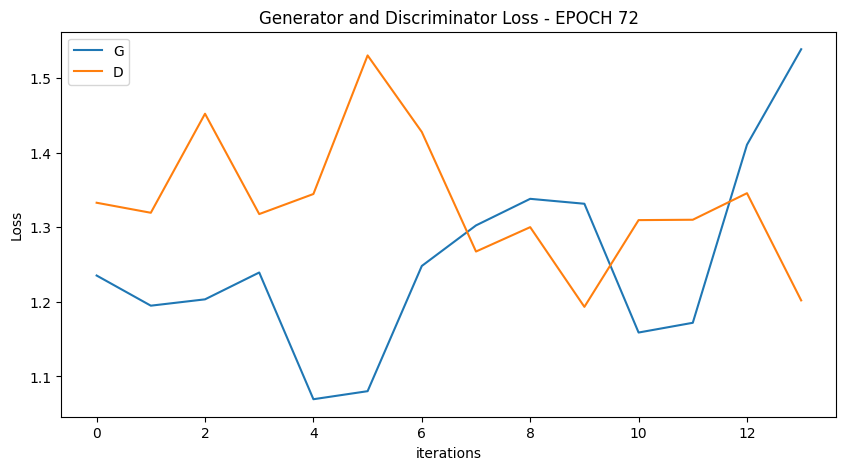

  0%|          | 0/14 [00:00<?, ?it/s]

[74/100][7/14] Loss_D: 1.6097 Loss_G: 1.1397 D(x): 0.3818 D(G(z)): 0.4364 / 0.3084
[74/100][14/14] Loss_D: 1.1832 Loss_G: 1.4427 D(x): 0.4347 D(G(z)): 0.2787 / 0.2174


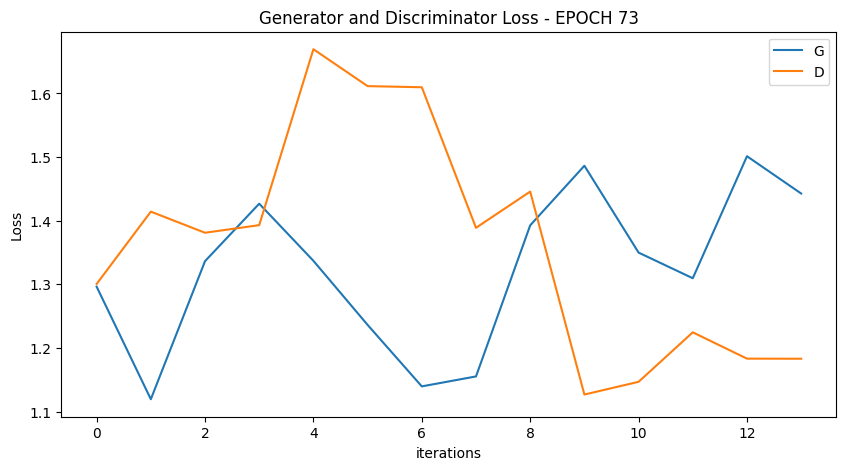

  0%|          | 0/14 [00:00<?, ?it/s]

[75/100][7/14] Loss_D: 1.0745 Loss_G: 1.5209 D(x): 0.5850 D(G(z)): 0.3642 / 0.2136
[75/100][14/14] Loss_D: 1.2399 Loss_G: 1.2921 D(x): 0.4875 D(G(z)): 0.3847 / 0.2596


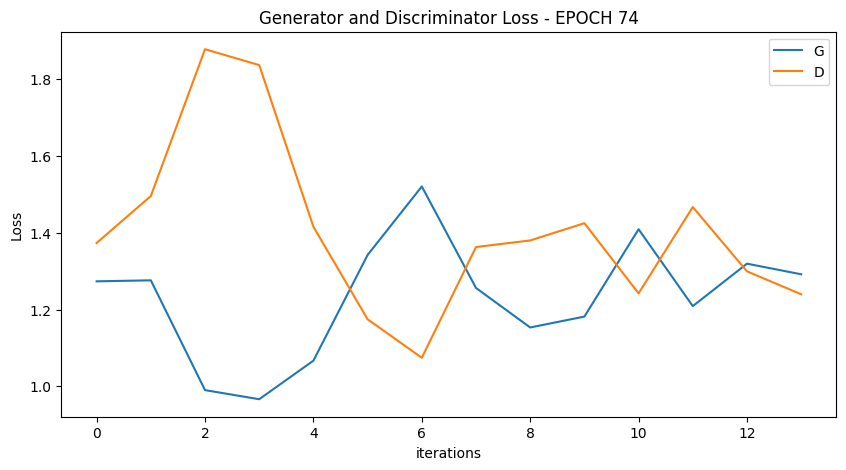

  0%|          | 0/14 [00:00<?, ?it/s]

[76/100][7/14] Loss_D: 1.2939 Loss_G: 1.3426 D(x): 0.5562 D(G(z)): 0.4633 / 0.2501
[76/100][14/14] Loss_D: 1.2649 Loss_G: 1.1575 D(x): 0.5128 D(G(z)): 0.4162 / 0.2978


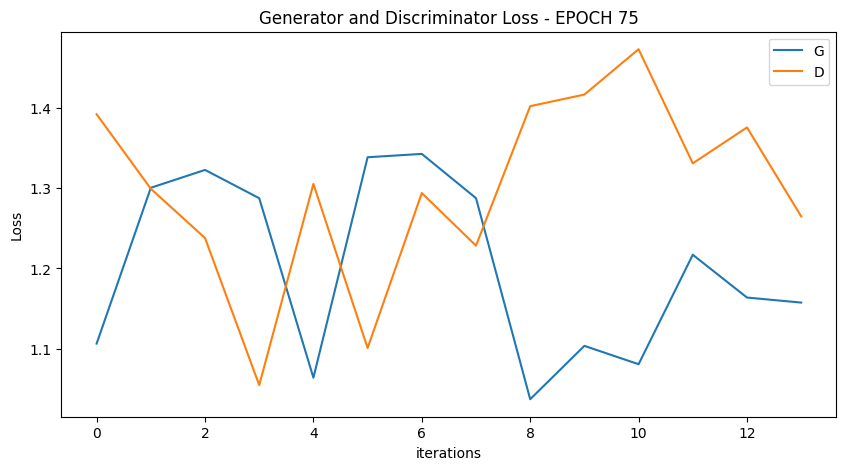

  0%|          | 0/14 [00:00<?, ?it/s]

[77/100][7/14] Loss_D: 1.4545 Loss_G: 1.2436 D(x): 0.4774 D(G(z)): 0.4849 / 0.2794
[77/100][14/14] Loss_D: 0.9590 Loss_G: 1.6546 D(x): 0.5896 D(G(z)): 0.2877 / 0.1773


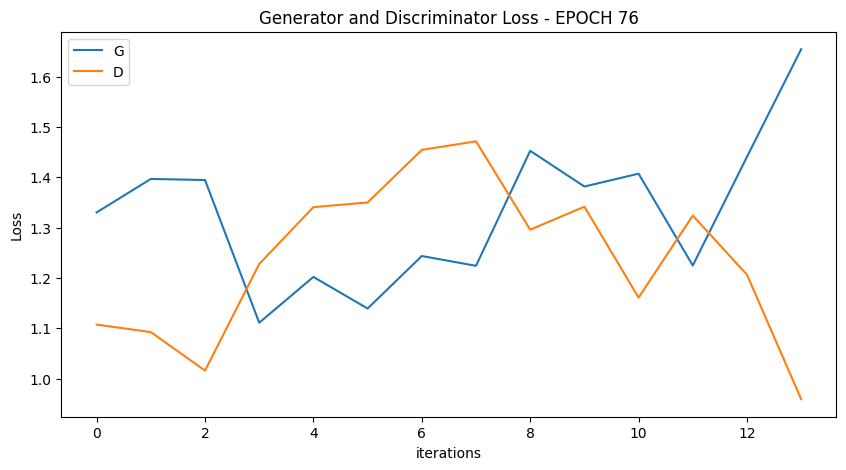

  0%|          | 0/14 [00:00<?, ?it/s]

[78/100][7/14] Loss_D: 1.3405 Loss_G: 1.3950 D(x): 0.5946 D(G(z)): 0.5006 / 0.2505
[78/100][14/14] Loss_D: 1.4055 Loss_G: 1.0734 D(x): 0.4120 D(G(z)): 0.3899 / 0.3369


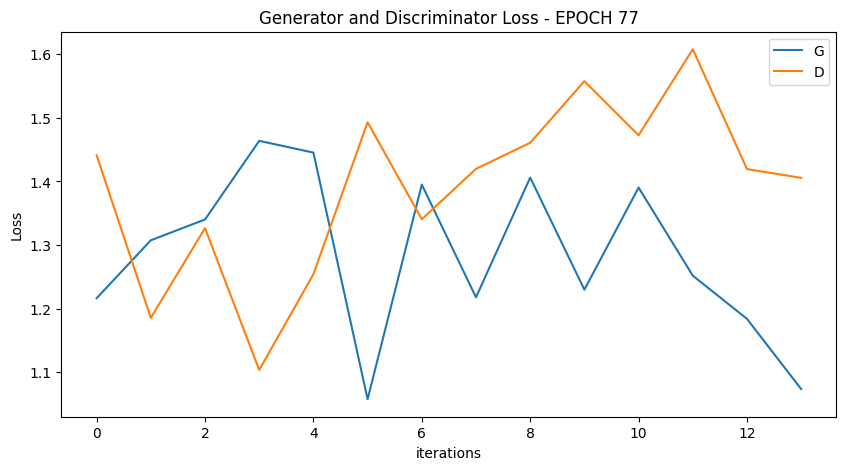

  0%|          | 0/14 [00:00<?, ?it/s]

[79/100][7/14] Loss_D: 1.4717 Loss_G: 1.0367 D(x): 0.4204 D(G(z)): 0.4149 / 0.3482
[79/100][14/14] Loss_D: 1.3009 Loss_G: 1.2601 D(x): 0.4315 D(G(z)): 0.3665 / 0.2623


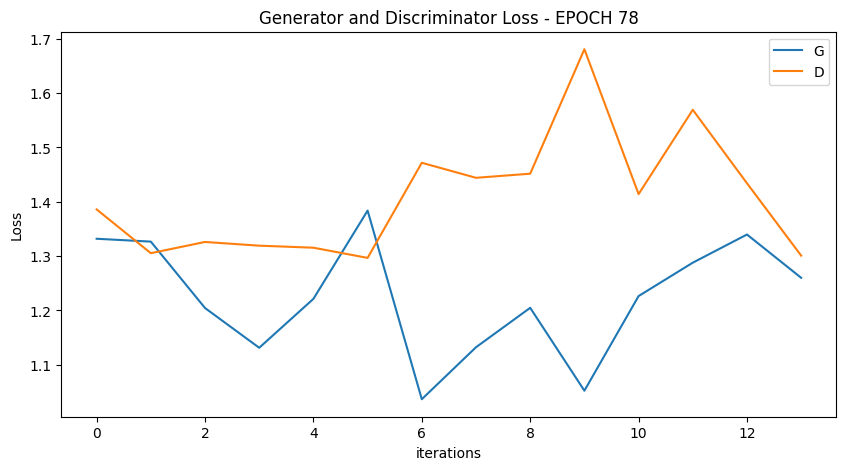

  0%|          | 0/14 [00:00<?, ?it/s]

[80/100][7/14] Loss_D: 1.3549 Loss_G: 1.1598 D(x): 0.4487 D(G(z)): 0.3977 / 0.3056
[80/100][14/14] Loss_D: 1.2491 Loss_G: 1.2082 D(x): 0.4874 D(G(z)): 0.3774 / 0.2850


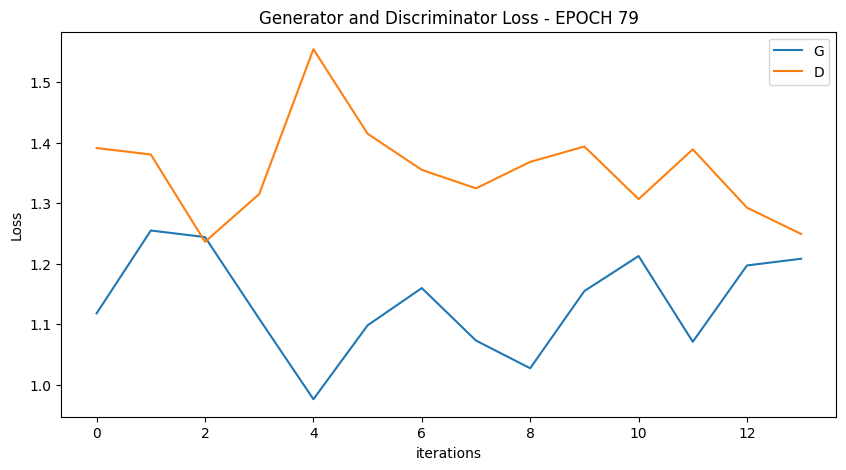

  0%|          | 0/14 [00:00<?, ?it/s]

[81/100][7/14] Loss_D: 1.3498 Loss_G: 1.1172 D(x): 0.4833 D(G(z)): 0.4367 / 0.3158
[81/100][14/14] Loss_D: 1.2730 Loss_G: 1.3448 D(x): 0.5316 D(G(z)): 0.4088 / 0.2446


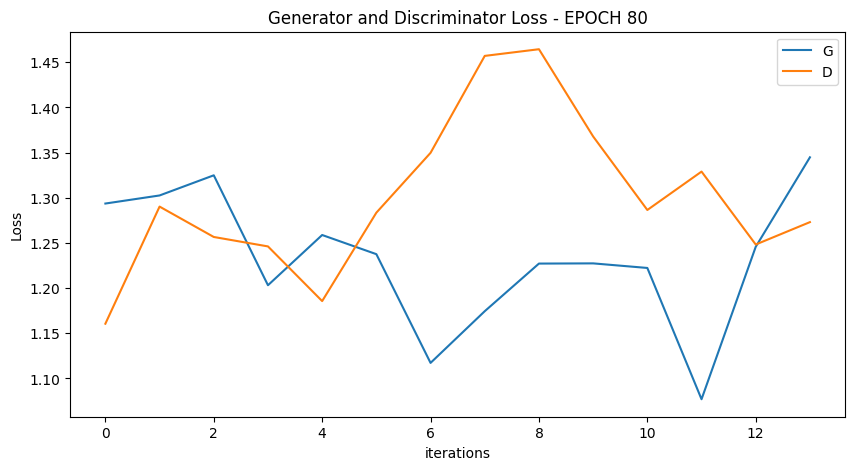

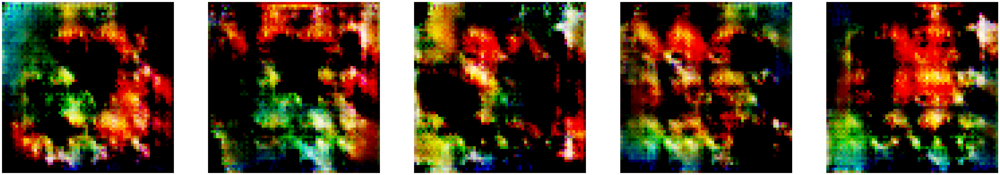

  0%|          | 0/14 [00:00<?, ?it/s]

[82/100][7/14] Loss_D: 1.6106 Loss_G: 1.1506 D(x): 0.3740 D(G(z)): 0.4222 / 0.3307
[82/100][14/14] Loss_D: 1.0896 Loss_G: 1.6319 D(x): 0.5879 D(G(z)): 0.3656 / 0.1850


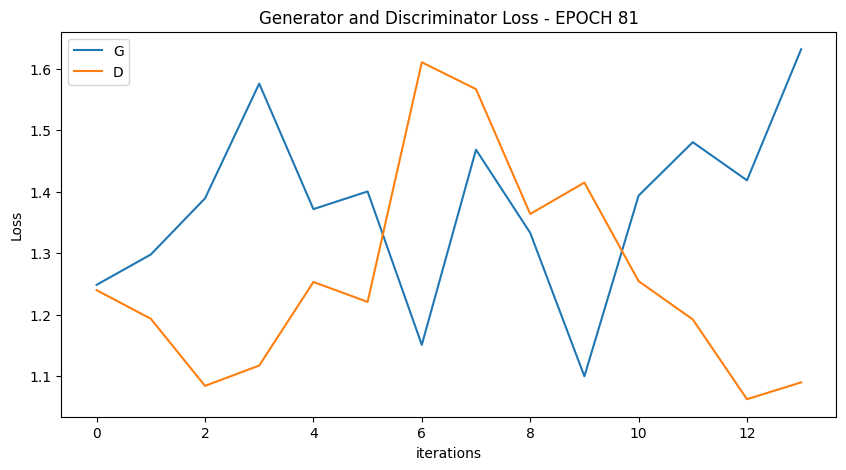

  0%|          | 0/14 [00:00<?, ?it/s]

[83/100][7/14] Loss_D: 1.4355 Loss_G: 1.0634 D(x): 0.4275 D(G(z)): 0.4077 / 0.3386
[83/100][14/14] Loss_D: 1.2247 Loss_G: 1.4727 D(x): 0.5074 D(G(z)): 0.3731 / 0.2206


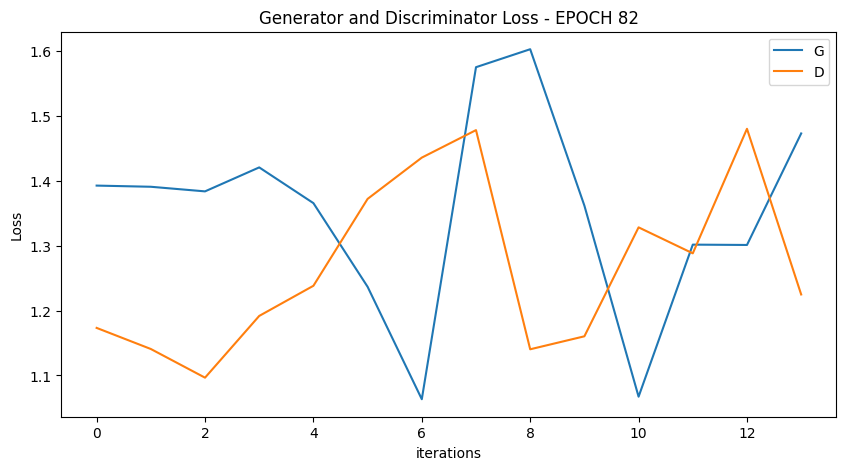

  0%|          | 0/14 [00:00<?, ?it/s]

[84/100][7/14] Loss_D: 1.1618 Loss_G: 1.5440 D(x): 0.5285 D(G(z)): 0.3681 / 0.2016
[84/100][14/14] Loss_D: 1.3605 Loss_G: 1.2168 D(x): 0.4593 D(G(z)): 0.4139 / 0.2839


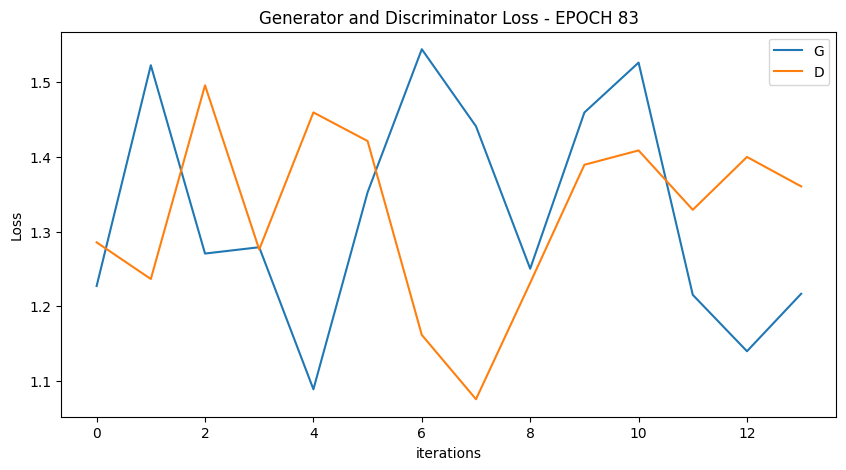

  0%|          | 0/14 [00:00<?, ?it/s]

[85/100][7/14] Loss_D: 1.3376 Loss_G: 1.2127 D(x): 0.5252 D(G(z)): 0.4518 / 0.2903
[85/100][14/14] Loss_D: 1.1989 Loss_G: 1.3316 D(x): 0.5759 D(G(z)): 0.4325 / 0.2502


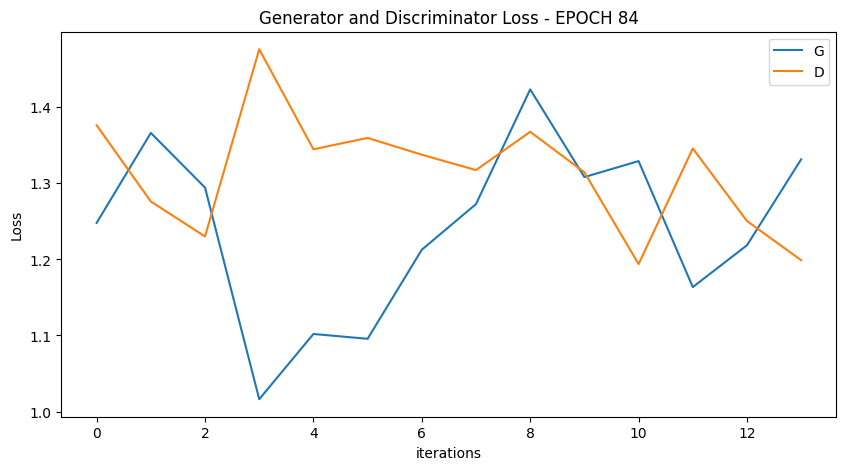

  0%|          | 0/14 [00:00<?, ?it/s]

[86/100][7/14] Loss_D: 1.0802 Loss_G: 1.4194 D(x): 0.5570 D(G(z)): 0.3600 / 0.2263
[86/100][14/14] Loss_D: 1.1854 Loss_G: 1.2047 D(x): 0.5207 D(G(z)): 0.3590 / 0.2827


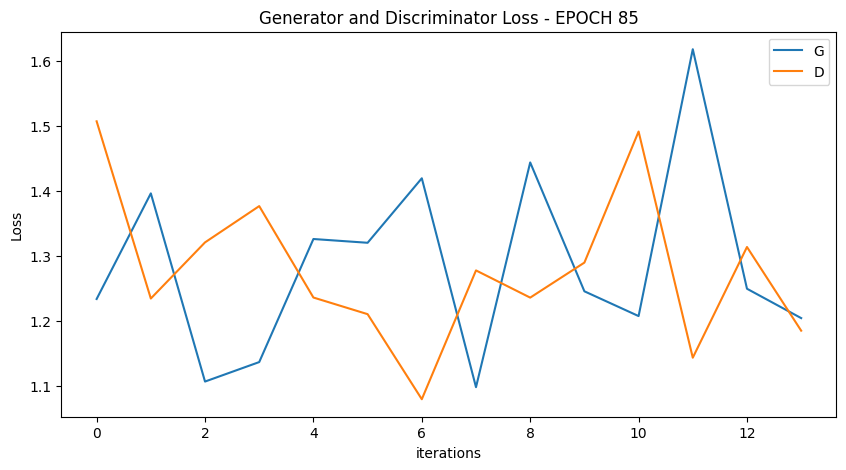

  0%|          | 0/14 [00:00<?, ?it/s]

[87/100][7/14] Loss_D: 1.4959 Loss_G: 1.2889 D(x): 0.5824 D(G(z)): 0.5430 / 0.2764
[87/100][14/14] Loss_D: 1.3846 Loss_G: 1.1183 D(x): 0.4909 D(G(z)): 0.4562 / 0.3141


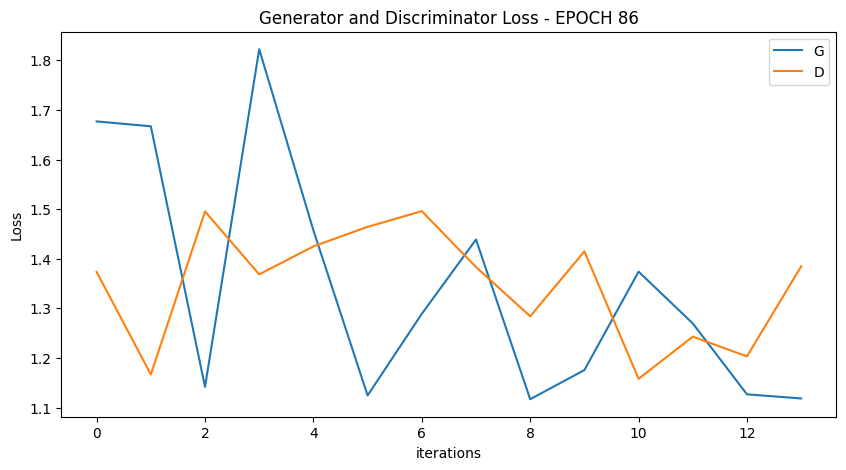

  0%|          | 0/14 [00:00<?, ?it/s]

[88/100][7/14] Loss_D: 1.3419 Loss_G: 1.2238 D(x): 0.4894 D(G(z)): 0.4259 / 0.2854
[88/100][14/14] Loss_D: 1.3254 Loss_G: 1.2278 D(x): 0.4653 D(G(z)): 0.4022 / 0.2692


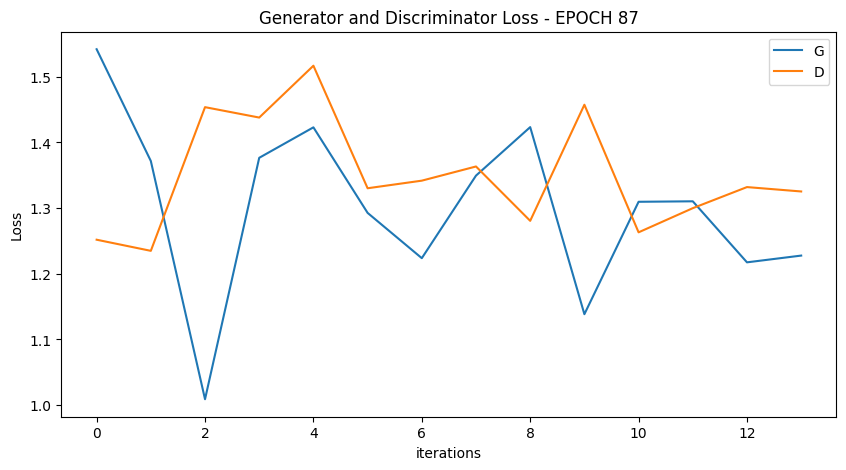

  0%|          | 0/14 [00:00<?, ?it/s]

[89/100][7/14] Loss_D: 1.0938 Loss_G: 1.8336 D(x): 0.7062 D(G(z)): 0.4434 / 0.1546
[89/100][14/14] Loss_D: 1.7789 Loss_G: 0.8975 D(x): 0.2724 D(G(z)): 0.3343 / 0.4274


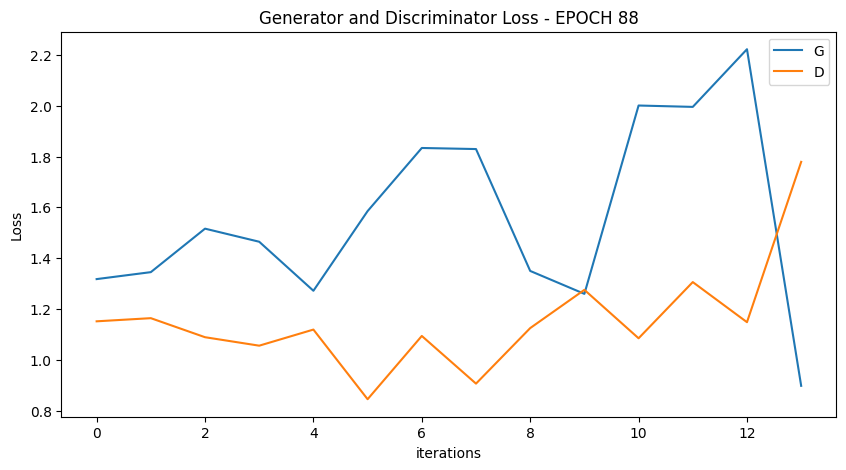

  0%|          | 0/14 [00:00<?, ?it/s]

[90/100][7/14] Loss_D: 1.4106 Loss_G: 1.2165 D(x): 0.5858 D(G(z)): 0.5255 / 0.3016
[90/100][14/14] Loss_D: 1.1337 Loss_G: 1.5601 D(x): 0.5463 D(G(z)): 0.3572 / 0.2060


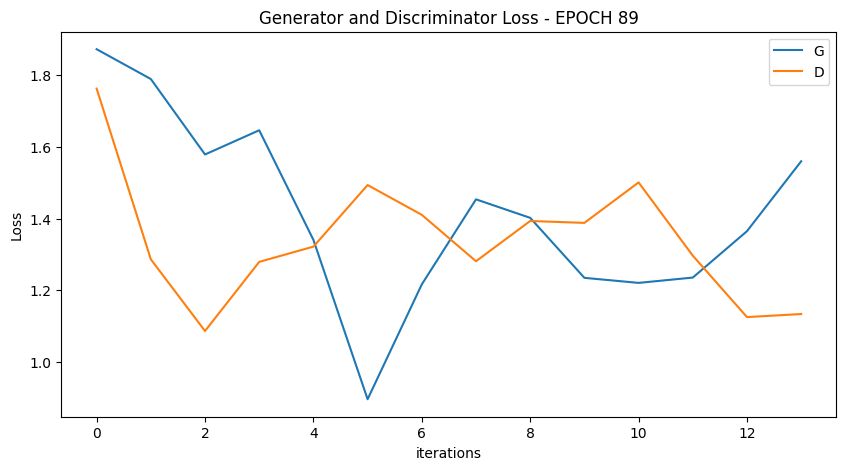

  0%|          | 0/14 [00:00<?, ?it/s]

[91/100][7/14] Loss_D: 1.3735 Loss_G: 1.2656 D(x): 0.4914 D(G(z)): 0.4532 / 0.2700
[91/100][14/14] Loss_D: 1.5291 Loss_G: 1.3544 D(x): 0.4153 D(G(z)): 0.4620 / 0.2411


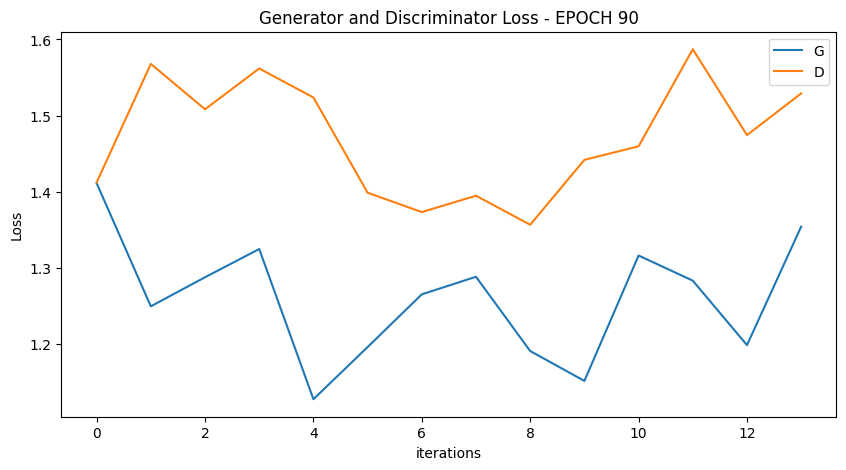

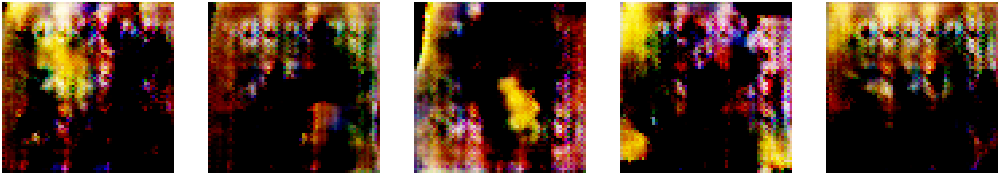

  0%|          | 0/14 [00:00<?, ?it/s]

[92/100][7/14] Loss_D: 1.3658 Loss_G: 1.4035 D(x): 0.4224 D(G(z)): 0.3818 / 0.2303
[92/100][14/14] Loss_D: 1.5874 Loss_G: 1.4006 D(x): 0.4769 D(G(z)): 0.5190 / 0.2382


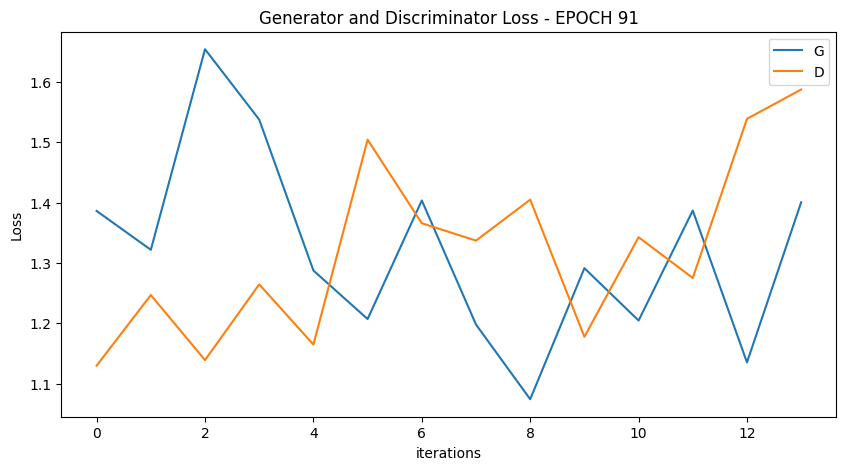

  0%|          | 0/14 [00:00<?, ?it/s]

[93/100][7/14] Loss_D: 1.0060 Loss_G: 1.5943 D(x): 0.5776 D(G(z)): 0.3265 / 0.1898
[93/100][14/14] Loss_D: 1.3050 Loss_G: 1.3916 D(x): 0.4537 D(G(z)): 0.3666 / 0.2318


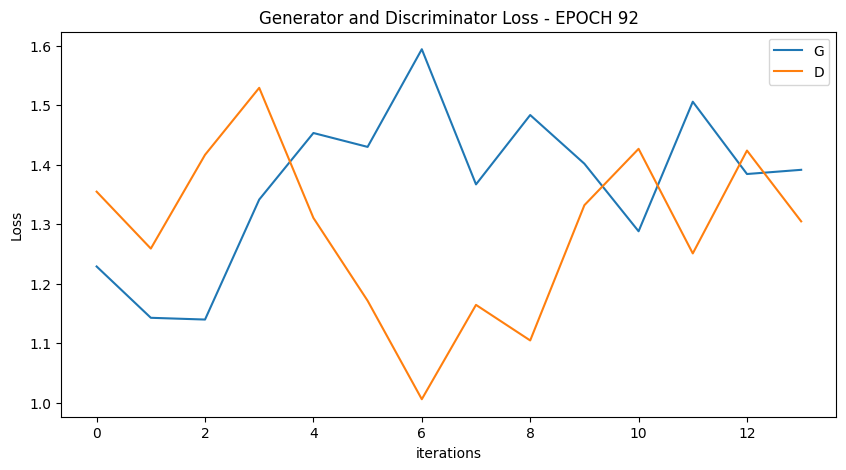

  0%|          | 0/14 [00:00<?, ?it/s]

[94/100][7/14] Loss_D: 1.3595 Loss_G: 1.2417 D(x): 0.4696 D(G(z)): 0.4061 / 0.2812
[94/100][14/14] Loss_D: 1.0664 Loss_G: 1.4360 D(x): 0.4971 D(G(z)): 0.2780 / 0.2239


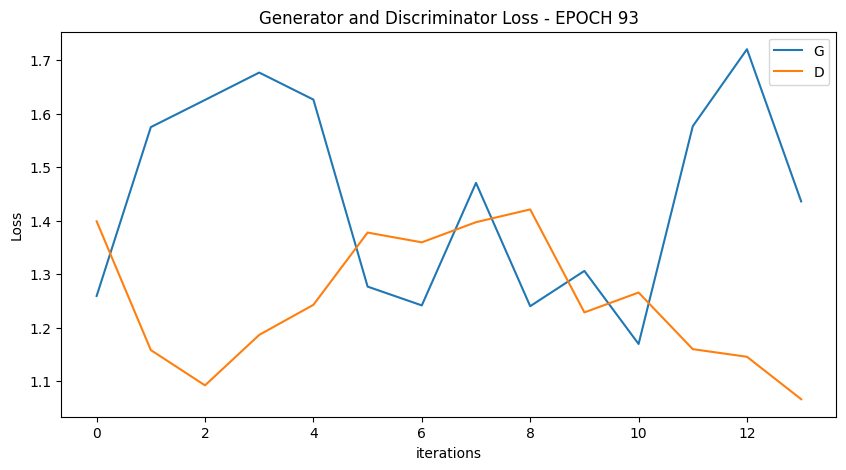

  0%|          | 0/14 [00:00<?, ?it/s]

[95/100][7/14] Loss_D: 1.3832 Loss_G: 1.3651 D(x): 0.3968 D(G(z)): 0.3085 / 0.2441
[95/100][14/14] Loss_D: 1.1877 Loss_G: 1.4082 D(x): 0.5158 D(G(z)): 0.3591 / 0.2305


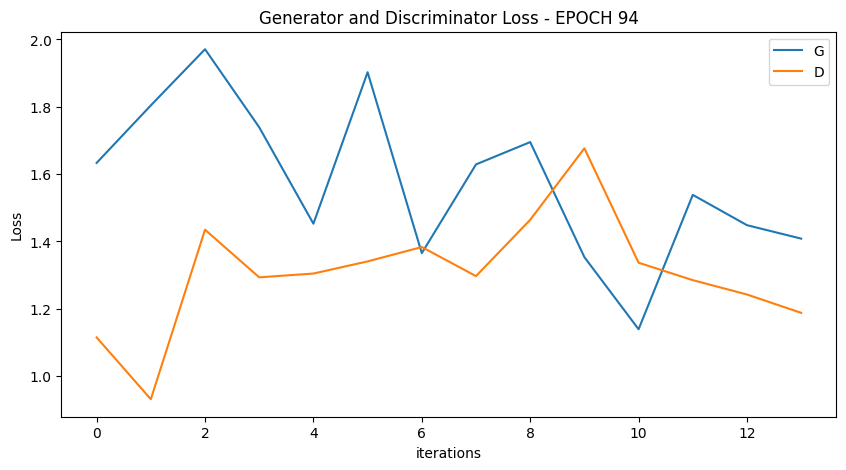

  0%|          | 0/14 [00:00<?, ?it/s]

[96/100][7/14] Loss_D: 1.2075 Loss_G: 1.4758 D(x): 0.5340 D(G(z)): 0.3867 / 0.2267
[96/100][14/14] Loss_D: 1.1984 Loss_G: 1.4426 D(x): 0.5768 D(G(z)): 0.4109 / 0.2294


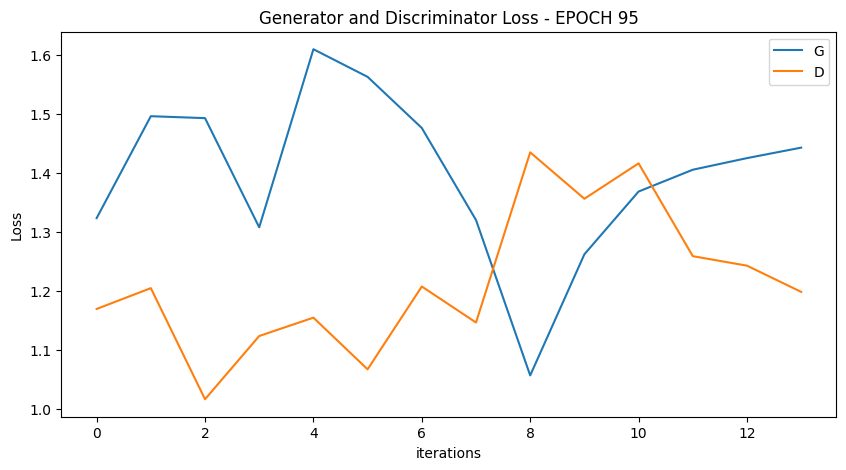

  0%|          | 0/14 [00:00<?, ?it/s]

[97/100][7/14] Loss_D: 1.3937 Loss_G: 1.3840 D(x): 0.3978 D(G(z)): 0.3260 / 0.2440
[97/100][14/14] Loss_D: 1.3337 Loss_G: 1.2605 D(x): 0.3574 D(G(z)): 0.2528 / 0.2713


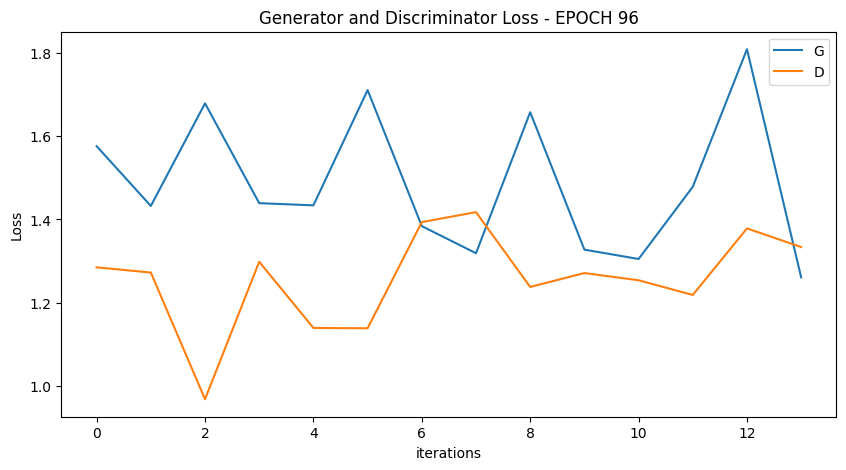

  0%|          | 0/14 [00:00<?, ?it/s]

[98/100][7/14] Loss_D: 1.3826 Loss_G: 1.4445 D(x): 0.5049 D(G(z)): 0.4594 / 0.2276
[98/100][14/14] Loss_D: 1.4893 Loss_G: 1.3016 D(x): 0.3608 D(G(z)): 0.3401 / 0.2691


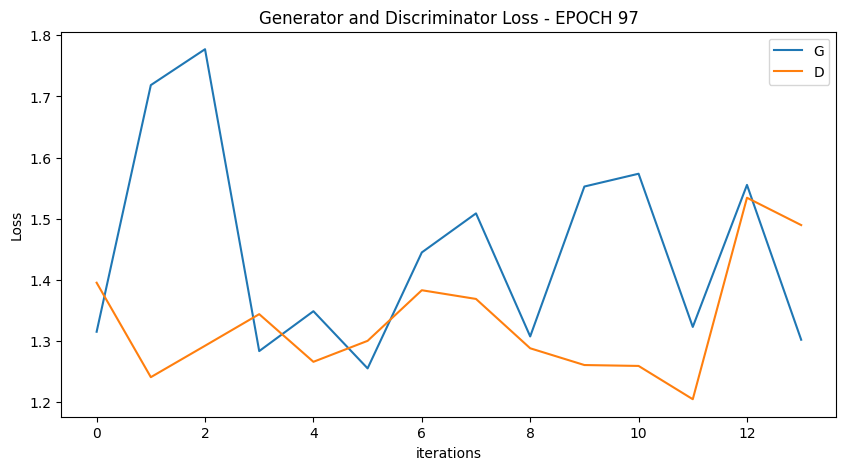

  0%|          | 0/14 [00:00<?, ?it/s]

[99/100][7/14] Loss_D: 1.1781 Loss_G: 1.2725 D(x): 0.5249 D(G(z)): 0.3683 / 0.2757
[99/100][14/14] Loss_D: 1.1449 Loss_G: 1.3836 D(x): 0.4597 D(G(z)): 0.2786 / 0.2463


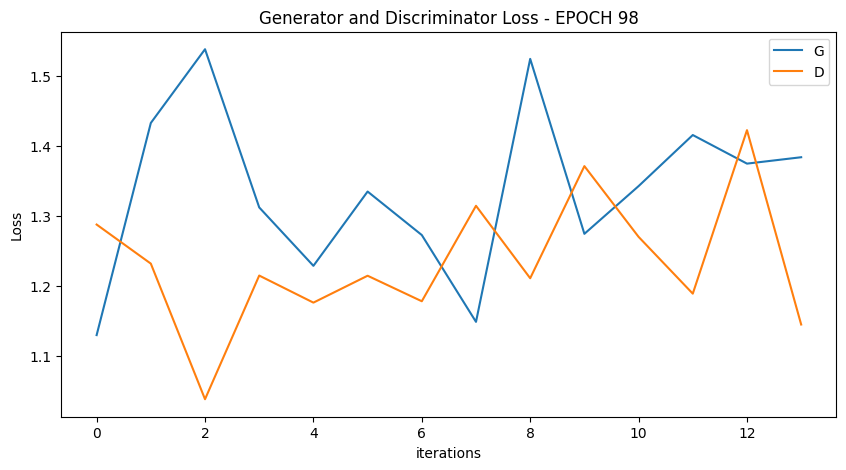

  0%|          | 0/14 [00:00<?, ?it/s]

[100/100][7/14] Loss_D: 1.4084 Loss_G: 1.1379 D(x): 0.3204 D(G(z)): 0.2351 / 0.3114
[100/100][14/14] Loss_D: 1.0653 Loss_G: 1.5425 D(x): 0.5960 D(G(z)): 0.3549 / 0.2073


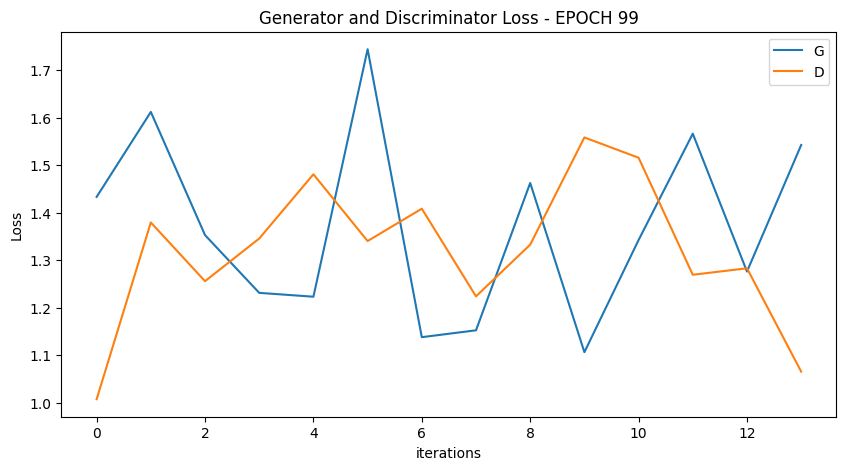

In [ ]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
\
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [ ]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  10.19203264951706


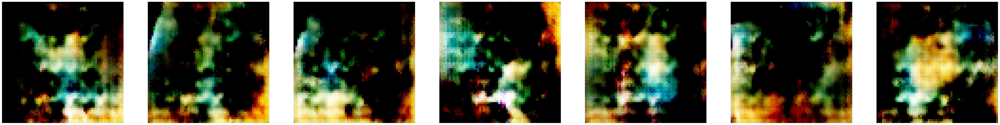

In [ ]:

show_generated_img(7)

In [ ]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

<ipython-input-21-55c27581f9dc>:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i_batch in tqdm(range(0, n_images, im_batch_size)):


  0%|          | 0/200 [00:00<?, ?it/s]

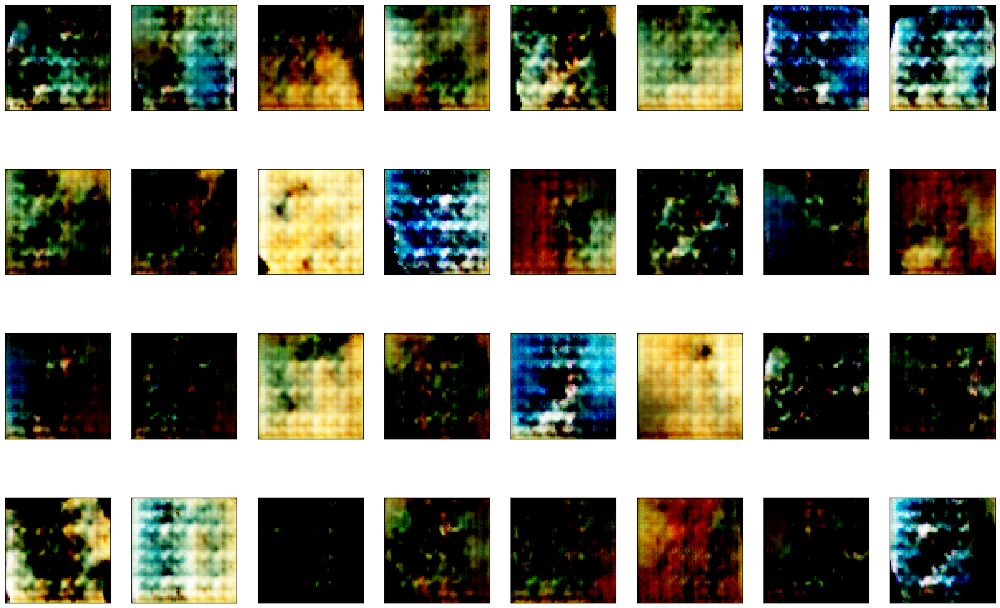

In [ ]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

In [ ]:
import shutil
shutil.make_archive('images', 'zip', '../output_images')

'/content/images.zip'

In [ ]:
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')